## Prerequisites


In [1]:
import dotenv

dotenv.load_dotenv()

True

In [2]:
project_name = "gender_male"
encoder_id = "mert_v1_95m"


# data preparation
target_column = "gender"
target_positive_class = "male"


## 1. Train Multiple CAVs for Significance Test


In [3]:
# training meta parameters
num_train_runs = 100
training_sample_count = 200


# training parameters
epochs = 500
batch_size = training_sample_count
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [4]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [5]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

In [6]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


Training run 1/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7065
Epoch 1 Validation Loss: 0.6995
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6503
Epoch 11 Validation Loss: 0.6664
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6062
Epoch 21 Validation Loss: 0.6382
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5664
Epoch 31 Validation Loss: 0.6149
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5312
Epoch 41 Validation Loss: 0.5940
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5003
Epoch 51 Validation Loss: 0.5781
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4732
Epoch 61 Validation Loss: 0.5641
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4492
Epoch 71 Validation Loss: 0.5528
Model saved to train

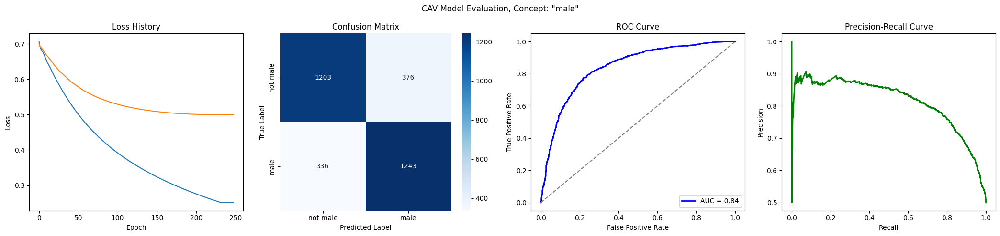

Training run 2/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6954
Epoch 1 Validation Loss: 0.6855
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6425
Epoch 11 Validation Loss: 0.6552
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5974
Epoch 21 Validation Loss: 0.6277
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5584
Epoch 31 Validation Loss: 0.6034
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5247
Epoch 41 Validation Loss: 0.5820
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4953
Epoch 51 Validation Loss: 0.5639
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4696
Epoch 61 Validation Loss: 0.5487
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4467
Epoch 71 Validation Loss: 0.5357
Model saved to train

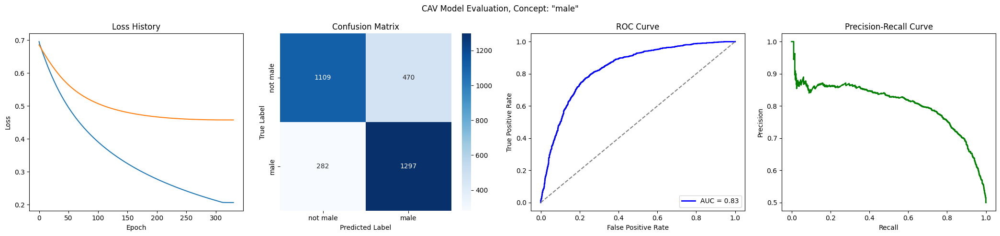

Training run 3/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6936
Epoch 1 Validation Loss: 0.6902
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6410
Epoch 11 Validation Loss: 0.6483
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5949
Epoch 21 Validation Loss: 0.6123
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5549
Epoch 31 Validation Loss: 0.5823
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5200
Epoch 41 Validation Loss: 0.5580
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4896
Epoch 51 Validation Loss: 0.5383
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4629
Epoch 61 Validation Loss: 0.5224
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4391
Epoch 71 Validation Loss: 0.5094
Model saved to train

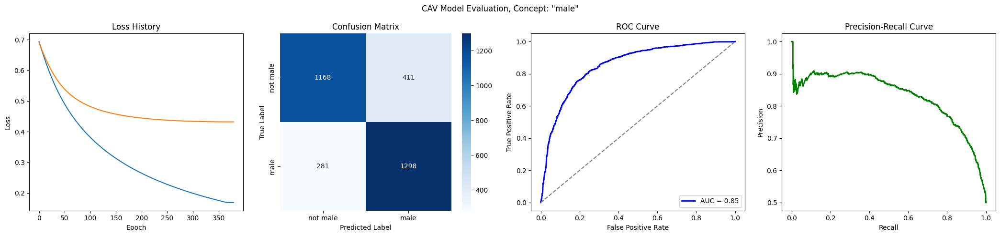

Training run 4/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6442
Epoch 11 Validation Loss: 0.6569
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6020
Epoch 21 Validation Loss: 0.6255
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5653
Epoch 31 Validation Loss: 0.5976
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5334
Epoch 41 Validation Loss: 0.5737
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5056
Epoch 51 Validation Loss: 0.5536
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4813
Epoch 61 Validation Loss: 0.5370
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4596
Epoch 71 Validation Loss: 0.5232
Model saved to train

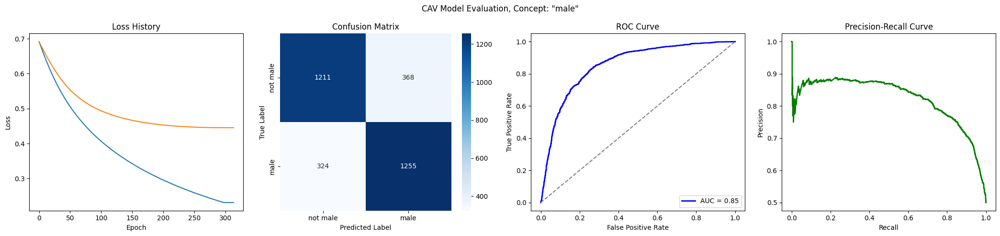

Training run 5/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7035
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6522
Epoch 11 Validation Loss: 0.6602
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6106
Epoch 21 Validation Loss: 0.6339
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5735
Epoch 31 Validation Loss: 0.6095
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5411
Epoch 41 Validation Loss: 0.5891
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5128
Epoch 51 Validation Loss: 0.5709
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4879
Epoch 61 Validation Loss: 0.5548
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4657
Epoch 71 Validation Loss: 0.5411
Model saved to train

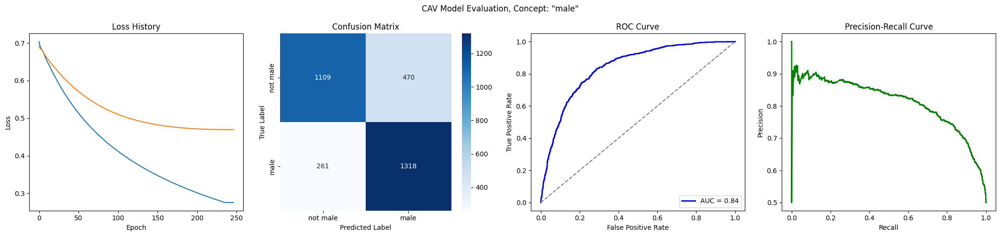

Training run 6/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6979
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6412
Epoch 11 Validation Loss: 0.6653
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5919
Epoch 21 Validation Loss: 0.6384
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5494
Epoch 31 Validation Loss: 0.6139
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5128
Epoch 41 Validation Loss: 0.5923
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4812
Epoch 51 Validation Loss: 0.5740
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4537
Epoch 61 Validation Loss: 0.5584
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4294
Epoch 71 Validation Loss: 0.5451
Model saved to train

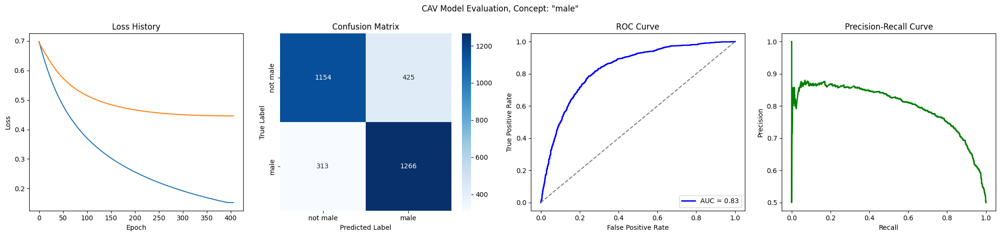

Training run 7/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6851
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6368
Epoch 11 Validation Loss: 0.6497
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5889
Epoch 21 Validation Loss: 0.6169
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5467
Epoch 31 Validation Loss: 0.5896
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5101
Epoch 41 Validation Loss: 0.5665
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4783
Epoch 51 Validation Loss: 0.5467
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4503
Epoch 61 Validation Loss: 0.5303
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4255
Epoch 71 Validation Loss: 0.5164
Model saved to train

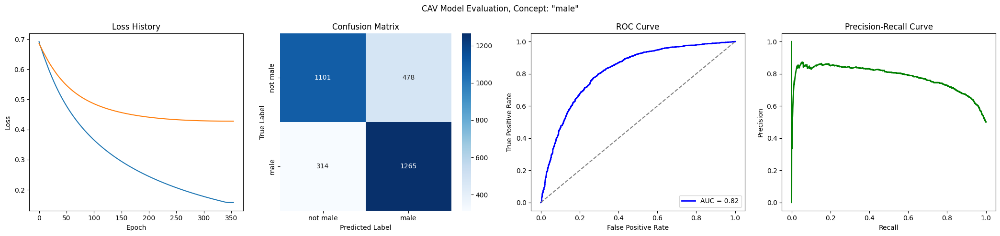

Training run 8/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7031
Epoch 1 Validation Loss: 0.6952
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6505
Epoch 11 Validation Loss: 0.6660
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6070
Epoch 21 Validation Loss: 0.6379
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5692
Epoch 31 Validation Loss: 0.6101
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5361
Epoch 41 Validation Loss: 0.5846
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5072
Epoch 51 Validation Loss: 0.5626
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4816
Epoch 61 Validation Loss: 0.5439
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4588
Epoch 71 Validation Loss: 0.5283
Model saved to train

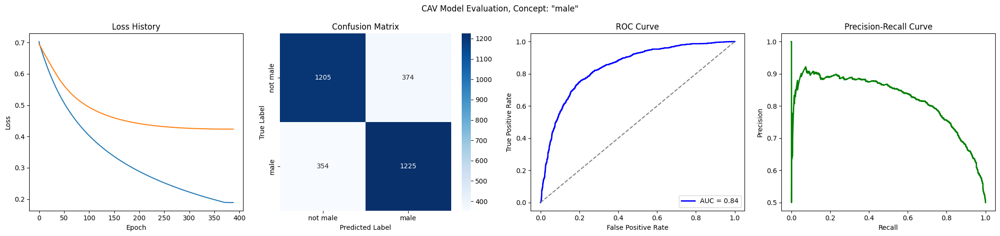

Training run 9/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6948
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6354
Epoch 11 Validation Loss: 0.6735
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5886
Epoch 21 Validation Loss: 0.6572
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5503
Epoch 31 Validation Loss: 0.6401
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5178
Epoch 41 Validation Loss: 0.6220
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4896
Epoch 51 Validation Loss: 0.6053
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4648
Epoch 61 Validation Loss: 0.5915
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4427
Epoch 71 Validation Loss: 0.5803
Model saved to train

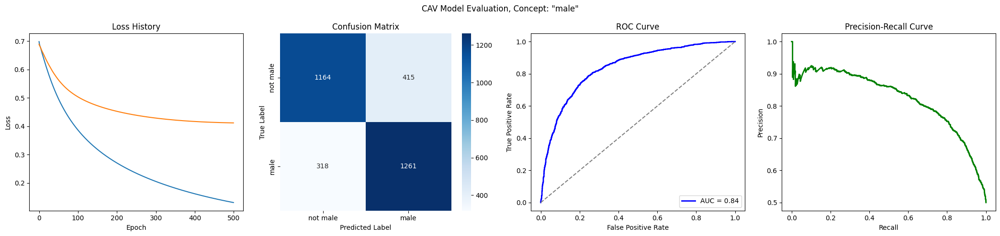

Training run 11/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7108
Epoch 1 Validation Loss: 0.6975
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6522
Epoch 11 Validation Loss: 0.6615
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6094
Epoch 21 Validation Loss: 0.6357
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5702
Epoch 31 Validation Loss: 0.6136
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5351
Epoch 41 Validation Loss: 0.5960
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5037
Epoch 51 Validation Loss: 0.5814
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4758
Epoch 61 Validation Loss: 0.5692
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4509
Epoch 71 Validation Loss: 0.5589
Model saved to trai

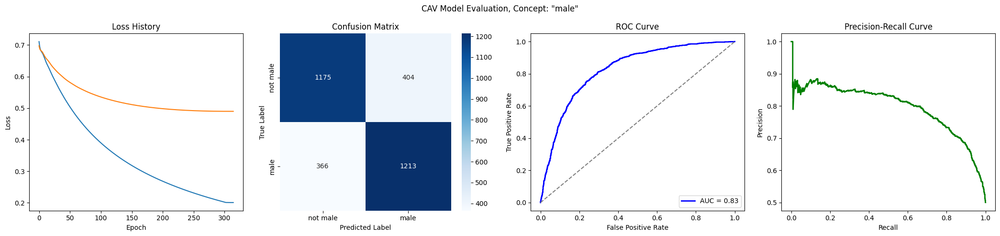

Training run 12/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6892
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6480
Epoch 11 Validation Loss: 0.6569
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6091
Epoch 21 Validation Loss: 0.6275
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5753
Epoch 31 Validation Loss: 0.6025
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5457
Epoch 41 Validation Loss: 0.5816
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5197
Epoch 51 Validation Loss: 0.5641
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4966
Epoch 61 Validation Loss: 0.5495
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4758
Epoch 71 Validation Loss: 0.5373
Model saved to trai

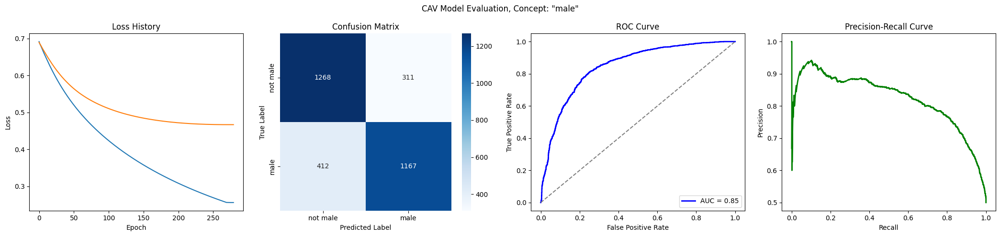

Training run 13/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6882
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6312
Epoch 11 Validation Loss: 0.6571
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5783
Epoch 21 Validation Loss: 0.6305
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5332
Epoch 31 Validation Loss: 0.6082
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4948
Epoch 41 Validation Loss: 0.5894
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4622
Epoch 51 Validation Loss: 0.5732
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4340
Epoch 61 Validation Loss: 0.5592
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4094
Epoch 71 Validation Loss: 0.5470
Model saved to trai

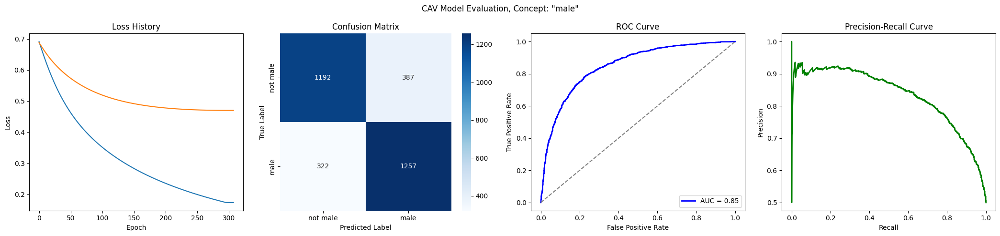

Training run 14/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7044
Epoch 1 Validation Loss: 0.6969
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6571
Epoch 11 Validation Loss: 0.6673
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6163
Epoch 21 Validation Loss: 0.6410
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5801
Epoch 31 Validation Loss: 0.6181
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5483
Epoch 41 Validation Loss: 0.5986
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5202
Epoch 51 Validation Loss: 0.5826
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4953
Epoch 61 Validation Loss: 0.5694
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4730
Epoch 71 Validation Loss: 0.5583
Model saved to trai

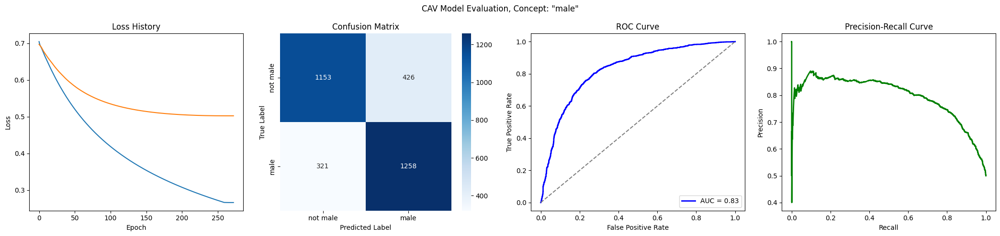

Training run 15/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7009
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6404
Epoch 11 Validation Loss: 0.6638
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5888
Epoch 21 Validation Loss: 0.6375
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5452
Epoch 31 Validation Loss: 0.6153
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5082
Epoch 41 Validation Loss: 0.5964
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4764
Epoch 51 Validation Loss: 0.5805
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4487
Epoch 61 Validation Loss: 0.5674
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4243
Epoch 71 Validation Loss: 0.5565
Model saved to trai

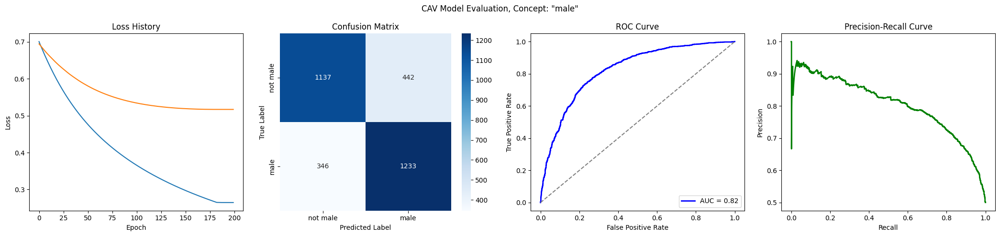

Training run 16/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6352
Epoch 11 Validation Loss: 0.6548
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5839
Epoch 21 Validation Loss: 0.6254
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5401
Epoch 31 Validation Loss: 0.6018
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5028
Epoch 41 Validation Loss: 0.5829
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4709
Epoch 51 Validation Loss: 0.5676
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4431
Epoch 61 Validation Loss: 0.5550
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4188
Epoch 71 Validation Loss: 0.5446
Model saved to trai

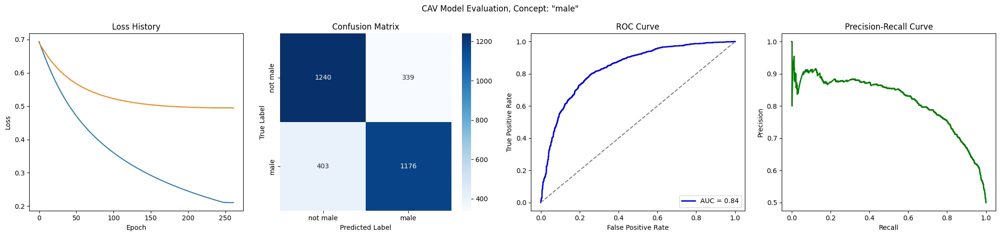

Training run 17/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6441
Epoch 11 Validation Loss: 0.6578
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5990
Epoch 21 Validation Loss: 0.6264
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5600
Epoch 31 Validation Loss: 0.5994
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5262
Epoch 41 Validation Loss: 0.5769
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4968
Epoch 51 Validation Loss: 0.5584
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4709
Epoch 61 Validation Loss: 0.5433
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4479
Epoch 71 Validation Loss: 0.5309
Model saved to trai

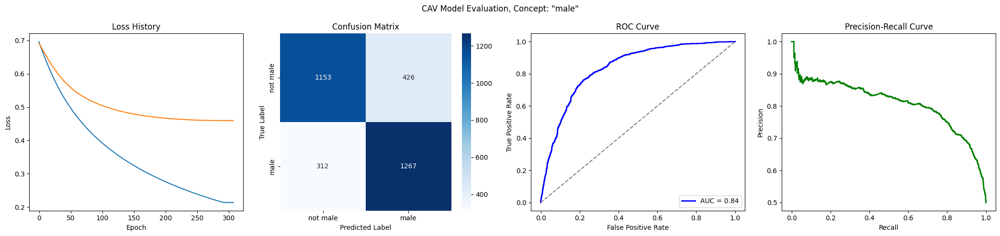

Training run 18/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6875
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6443
Epoch 11 Validation Loss: 0.6558
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5986
Epoch 21 Validation Loss: 0.6273
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5593
Epoch 31 Validation Loss: 0.6035
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5256
Epoch 41 Validation Loss: 0.5837
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4965
Epoch 51 Validation Loss: 0.5671
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4712
Epoch 61 Validation Loss: 0.5531
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4489
Epoch 71 Validation Loss: 0.5414
Model saved to trai

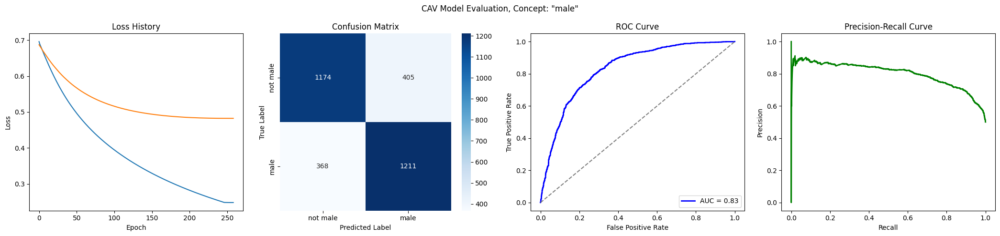

Training run 19/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6909
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6693
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6030
Epoch 21 Validation Loss: 0.6482
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5654
Epoch 31 Validation Loss: 0.6302
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5323
Epoch 41 Validation Loss: 0.6130
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5030
Epoch 51 Validation Loss: 0.5977
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4770
Epoch 61 Validation Loss: 0.5847
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4536
Epoch 71 Validation Loss: 0.5733
Model saved to trai

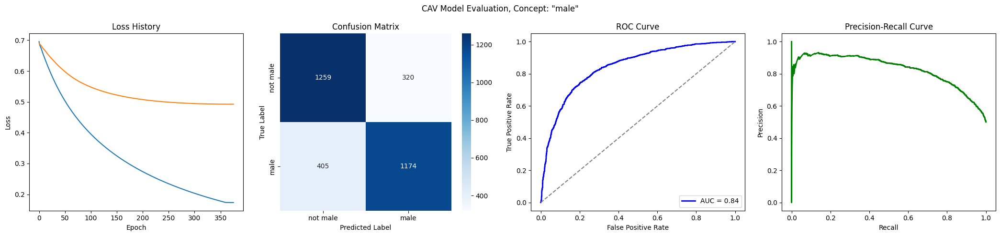

Training run 20/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7099
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6583
Epoch 11 Validation Loss: 0.6602
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6198
Epoch 21 Validation Loss: 0.6323
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5847
Epoch 31 Validation Loss: 0.6079
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5531
Epoch 41 Validation Loss: 0.5878
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5249
Epoch 51 Validation Loss: 0.5711
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4996
Epoch 61 Validation Loss: 0.5578
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4767
Epoch 71 Validation Loss: 0.5469
Model saved to trai

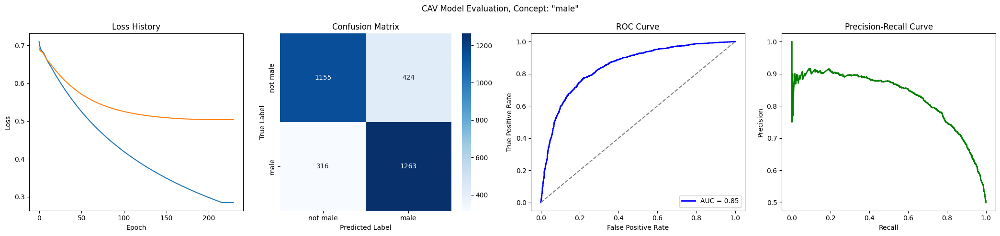

Training run 21/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7004
Epoch 1 Validation Loss: 0.6893
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6492
Epoch 11 Validation Loss: 0.6573
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6039
Epoch 21 Validation Loss: 0.6287
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5644
Epoch 31 Validation Loss: 0.6048
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5298
Epoch 41 Validation Loss: 0.5844
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4995
Epoch 51 Validation Loss: 0.5675
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4728
Epoch 61 Validation Loss: 0.5533
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4490
Epoch 71 Validation Loss: 0.5414
Model saved to trai

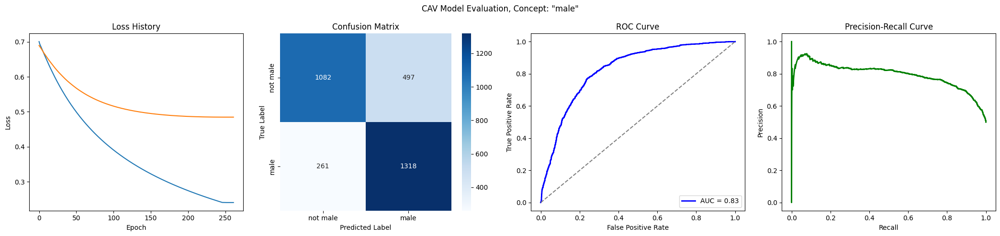

Training run 22/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6989
Epoch 1 Validation Loss: 0.6883
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6511
Epoch 11 Validation Loss: 0.6602
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6106
Epoch 21 Validation Loss: 0.6329
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5738
Epoch 31 Validation Loss: 0.6076
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5412
Epoch 41 Validation Loss: 0.5851
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5124
Epoch 51 Validation Loss: 0.5655
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4867
Epoch 61 Validation Loss: 0.5483
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4638
Epoch 71 Validation Loss: 0.5333
Model saved to trai

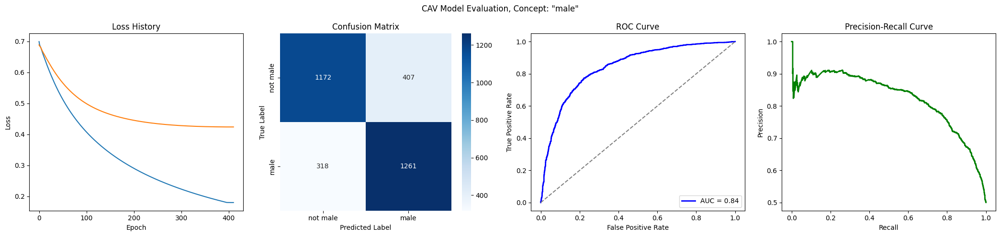

Training run 23/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6854
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6422
Epoch 11 Validation Loss: 0.6512
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5981
Epoch 21 Validation Loss: 0.6207
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5601
Epoch 31 Validation Loss: 0.5953
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5271
Epoch 41 Validation Loss: 0.5743
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4983
Epoch 51 Validation Loss: 0.5568
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4727
Epoch 61 Validation Loss: 0.5419
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4498
Epoch 71 Validation Loss: 0.5292
Model saved to trai

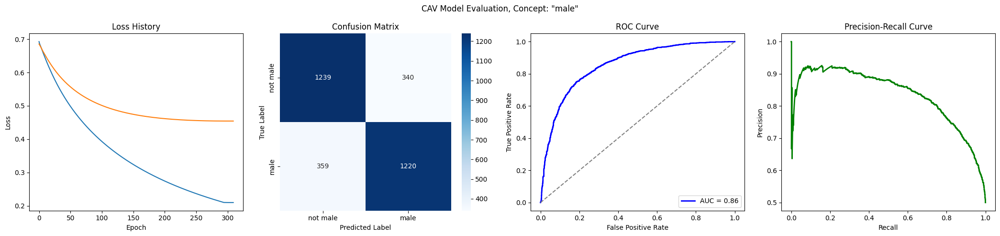

Training run 24/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6432
Epoch 11 Validation Loss: 0.6549
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5959
Epoch 21 Validation Loss: 0.6240
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5545
Epoch 31 Validation Loss: 0.5974
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5186
Epoch 41 Validation Loss: 0.5748
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4875
Epoch 51 Validation Loss: 0.5558
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4603
Epoch 61 Validation Loss: 0.5398
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4362
Epoch 71 Validation Loss: 0.5263
Model saved to trai

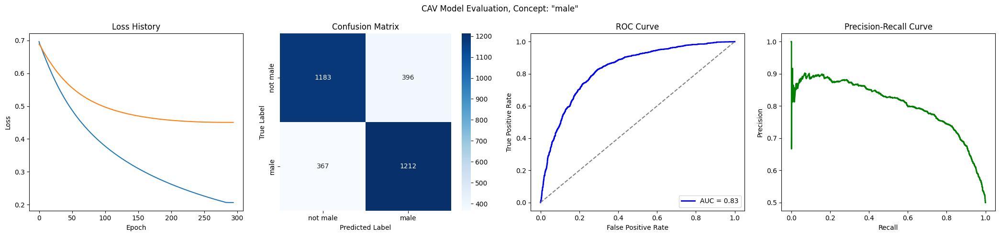

Training run 25/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7075
Epoch 1 Validation Loss: 0.6953
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6549
Epoch 11 Validation Loss: 0.6658
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6144
Epoch 21 Validation Loss: 0.6413
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5779
Epoch 31 Validation Loss: 0.6193
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5456
Epoch 41 Validation Loss: 0.6008
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5170
Epoch 51 Validation Loss: 0.5847
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4917
Epoch 61 Validation Loss: 0.5712
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4690
Epoch 71 Validation Loss: 0.5596
Model saved to trai

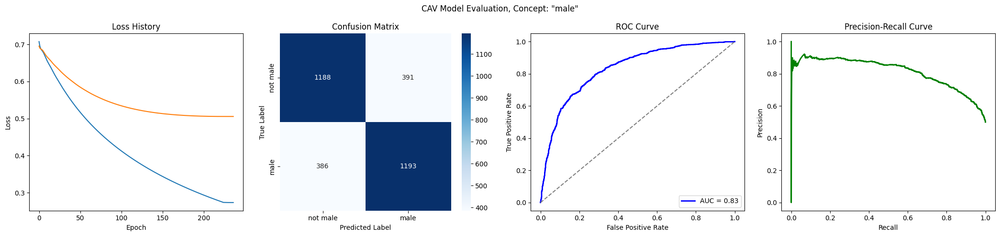

Training run 26/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6958
Epoch 1 Validation Loss: 0.6920
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6450
Epoch 11 Validation Loss: 0.6623
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6000
Epoch 21 Validation Loss: 0.6351
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5607
Epoch 31 Validation Loss: 0.6119
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5266
Epoch 41 Validation Loss: 0.5921
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4969
Epoch 51 Validation Loss: 0.5754
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4708
Epoch 61 Validation Loss: 0.5612
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4477
Epoch 71 Validation Loss: 0.5491
Model saved to trai

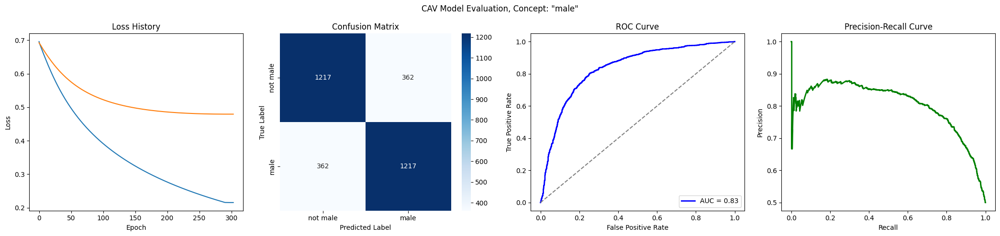

Training run 27/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6935
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6414
Epoch 11 Validation Loss: 0.6547
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5969
Epoch 21 Validation Loss: 0.6255
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5591
Epoch 31 Validation Loss: 0.6018
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5268
Epoch 41 Validation Loss: 0.5826
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4987
Epoch 51 Validation Loss: 0.5670
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4741
Epoch 61 Validation Loss: 0.5540
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4521
Epoch 71 Validation Loss: 0.5430
Model saved to trai

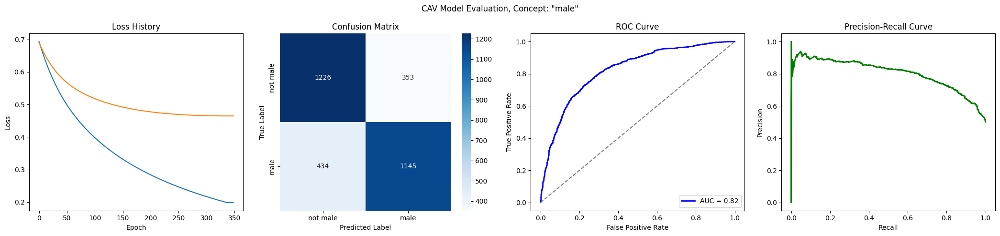

Training run 28/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7013
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6485
Epoch 11 Validation Loss: 0.6585
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6021
Epoch 21 Validation Loss: 0.6320
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5621
Epoch 31 Validation Loss: 0.6100
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5274
Epoch 41 Validation Loss: 0.5911
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4971
Epoch 51 Validation Loss: 0.5752
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4703
Epoch 61 Validation Loss: 0.5620
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4465
Epoch 71 Validation Loss: 0.5507
Model saved to trai

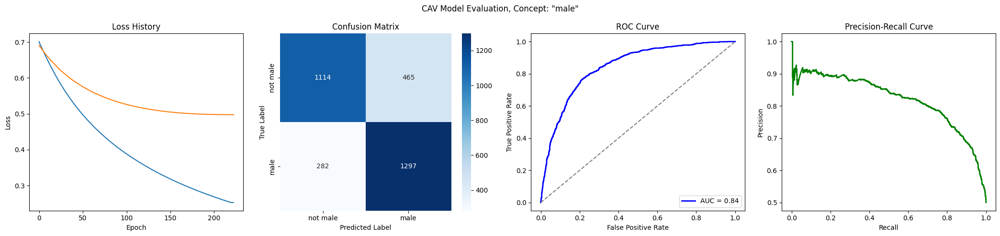

Training run 29/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6944
Epoch 1 Validation Loss: 0.6906
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6404
Epoch 11 Validation Loss: 0.6559
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5940
Epoch 21 Validation Loss: 0.6245
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5544
Epoch 31 Validation Loss: 0.5972
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5205
Epoch 41 Validation Loss: 0.5742
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4915
Epoch 51 Validation Loss: 0.5550
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4664
Epoch 61 Validation Loss: 0.5390
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4443
Epoch 71 Validation Loss: 0.5256
Model saved to trai

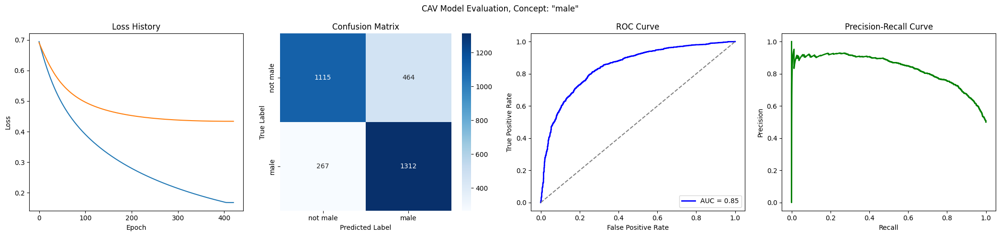

Training run 30/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6448
Epoch 11 Validation Loss: 0.6654
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6043
Epoch 21 Validation Loss: 0.6427
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5685
Epoch 31 Validation Loss: 0.6202
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5370
Epoch 41 Validation Loss: 0.5997
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5090
Epoch 51 Validation Loss: 0.5820
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4842
Epoch 61 Validation Loss: 0.5668
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4619
Epoch 71 Validation Loss: 0.5541
Model saved to trai

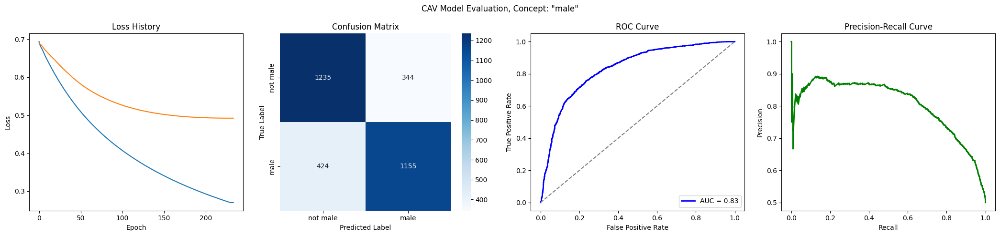

Training run 31/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6868
Epoch 1 Validation Loss: 0.6820
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6301
Epoch 11 Validation Loss: 0.6488
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5811
Epoch 21 Validation Loss: 0.6193
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5391
Epoch 31 Validation Loss: 0.5938
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5033
Epoch 41 Validation Loss: 0.5727
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4727
Epoch 51 Validation Loss: 0.5555
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4462
Epoch 61 Validation Loss: 0.5414
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4230
Epoch 71 Validation Loss: 0.5296
Model saved to trai

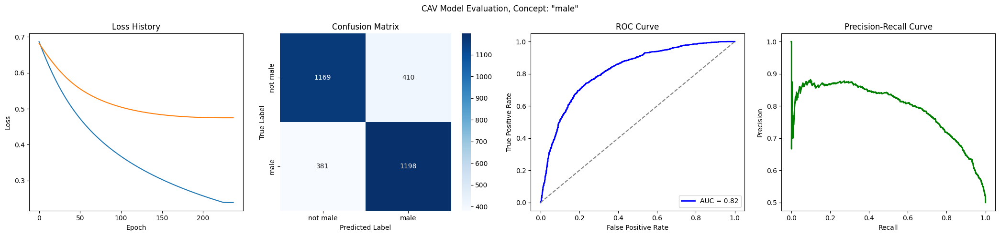

Training run 32/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6888
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6401
Epoch 11 Validation Loss: 0.6514
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5919
Epoch 21 Validation Loss: 0.6189
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5507
Epoch 31 Validation Loss: 0.5915
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5157
Epoch 41 Validation Loss: 0.5686
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4856
Epoch 51 Validation Loss: 0.5495
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4595
Epoch 61 Validation Loss: 0.5333
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4365
Epoch 71 Validation Loss: 0.5195
Model saved to trai

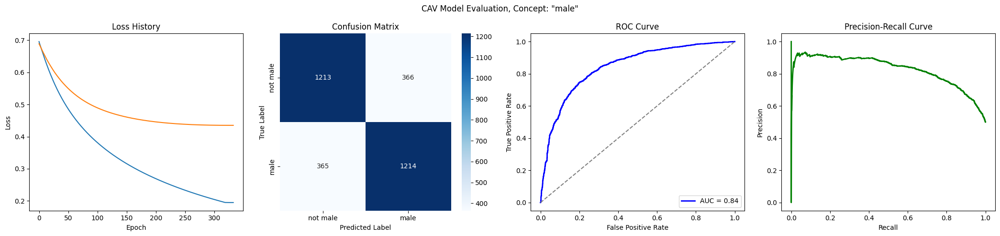

Training run 33/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7018
Epoch 1 Validation Loss: 0.6900
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6388
Epoch 11 Validation Loss: 0.6572
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5873
Epoch 21 Validation Loss: 0.6317
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5447
Epoch 31 Validation Loss: 0.6105
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5090
Epoch 41 Validation Loss: 0.5928
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4788
Epoch 51 Validation Loss: 0.5784
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4528
Epoch 61 Validation Loss: 0.5672
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4301
Epoch 71 Validation Loss: 0.5586
Model saved to trai

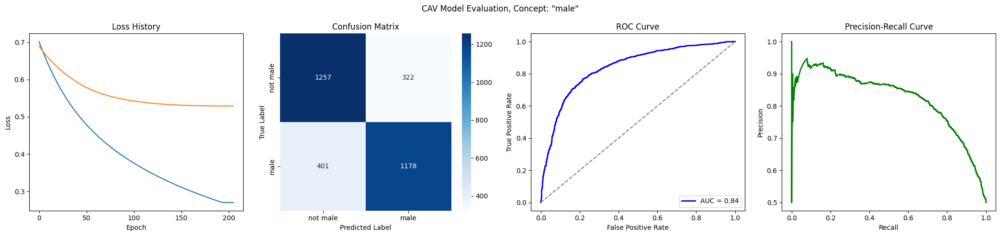

Training run 34/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6953
Epoch 1 Validation Loss: 0.6869
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6329
Epoch 11 Validation Loss: 0.6744
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5824
Epoch 21 Validation Loss: 0.6621
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5410
Epoch 31 Validation Loss: 0.6487
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5065
Epoch 41 Validation Loss: 0.6354
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4772
Epoch 51 Validation Loss: 0.6236
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4518
Epoch 61 Validation Loss: 0.6139
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4296
Epoch 71 Validation Loss: 0.6062
Model saved to trai

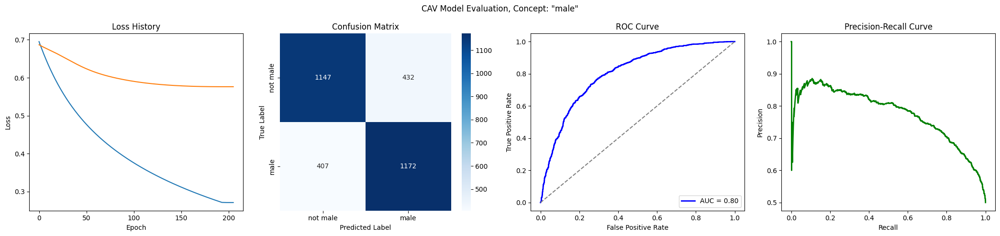

Training run 35/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6939
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6370
Epoch 11 Validation Loss: 0.6554
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5883
Epoch 21 Validation Loss: 0.6245
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5467
Epoch 31 Validation Loss: 0.5970
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5112
Epoch 41 Validation Loss: 0.5734
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4809
Epoch 51 Validation Loss: 0.5538
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4547
Epoch 61 Validation Loss: 0.5375
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4319
Epoch 71 Validation Loss: 0.5237
Model saved to trai

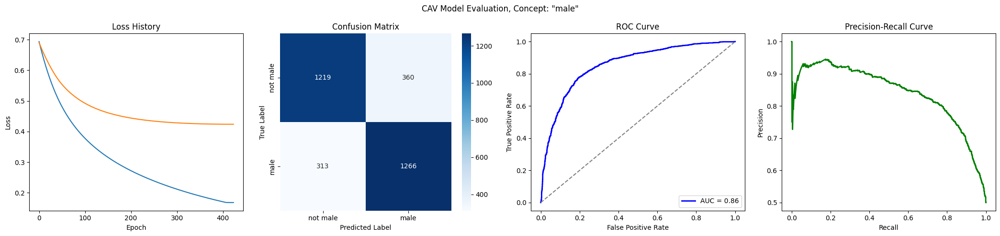

Training run 36/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6881
Epoch 1 Validation Loss: 0.6790
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6289
Epoch 11 Validation Loss: 0.6457
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5780
Epoch 21 Validation Loss: 0.6179
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5351
Epoch 31 Validation Loss: 0.5948
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4990
Epoch 41 Validation Loss: 0.5754
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4683
Epoch 51 Validation Loss: 0.5588
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4419
Epoch 61 Validation Loss: 0.5445
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4187
Epoch 71 Validation Loss: 0.5321
Model saved to trai

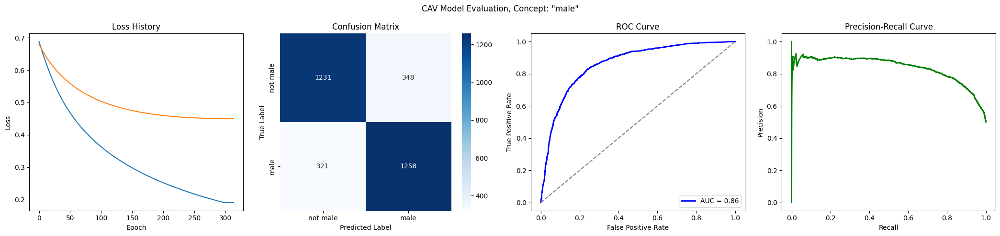

Training run 37/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6876
Epoch 1 Validation Loss: 0.6852
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6313
Epoch 11 Validation Loss: 0.6530
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5829
Epoch 21 Validation Loss: 0.6255
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5416
Epoch 31 Validation Loss: 0.6023
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5062
Epoch 41 Validation Loss: 0.5822
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4757
Epoch 51 Validation Loss: 0.5645
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4490
Epoch 61 Validation Loss: 0.5490
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4254
Epoch 71 Validation Loss: 0.5354
Model saved to trai

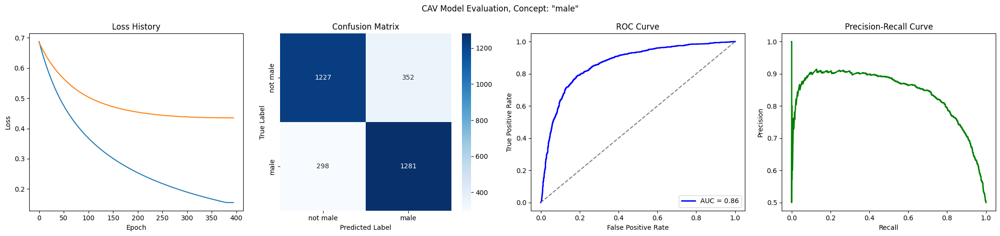

Training run 38/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6453
Epoch 11 Validation Loss: 0.6628
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6002
Epoch 21 Validation Loss: 0.6402
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5611
Epoch 31 Validation Loss: 0.6214
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5274
Epoch 41 Validation Loss: 0.6057
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4982
Epoch 51 Validation Loss: 0.5928
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4726
Epoch 61 Validation Loss: 0.5820
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4500
Epoch 71 Validation Loss: 0.5729
Model saved to trai

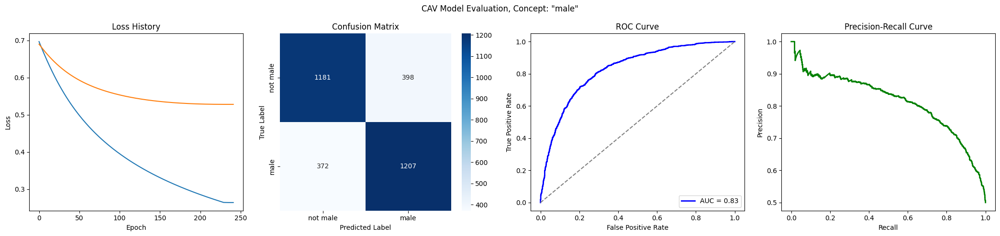

Training run 39/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6864
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6329
Epoch 11 Validation Loss: 0.6467
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5824
Epoch 21 Validation Loss: 0.6129
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5396
Epoch 31 Validation Loss: 0.5849
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5035
Epoch 41 Validation Loss: 0.5622
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4728
Epoch 51 Validation Loss: 0.5437
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4464
Epoch 61 Validation Loss: 0.5285
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4235
Epoch 71 Validation Loss: 0.5160
Model saved to trai

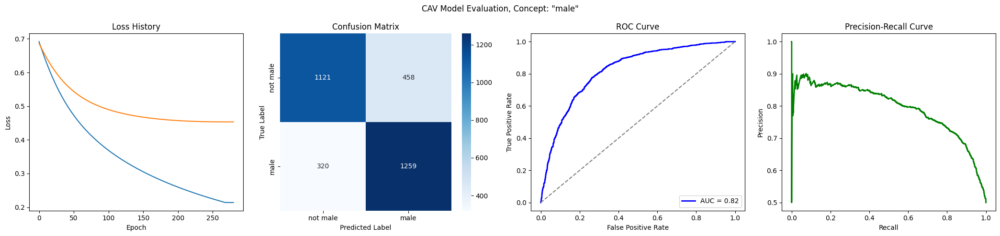

Training run 40/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6976
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6487
Epoch 11 Validation Loss: 0.6663
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6062
Epoch 21 Validation Loss: 0.6426
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5689
Epoch 31 Validation Loss: 0.6210
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5361
Epoch 41 Validation Loss: 0.6016
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5072
Epoch 51 Validation Loss: 0.5850
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4816
Epoch 61 Validation Loss: 0.5710
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4585
Epoch 71 Validation Loss: 0.5592
Model saved to trai

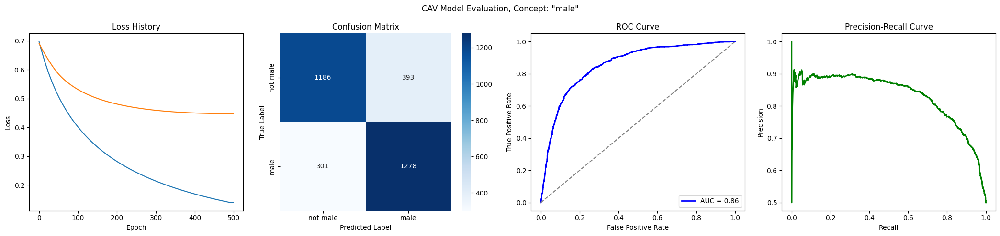

Training run 41/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6980
Epoch 1 Validation Loss: 0.6879
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6420
Epoch 11 Validation Loss: 0.6522
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5943
Epoch 21 Validation Loss: 0.6210
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5533
Epoch 31 Validation Loss: 0.5944
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5184
Epoch 41 Validation Loss: 0.5718
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4884
Epoch 51 Validation Loss: 0.5527
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4626
Epoch 61 Validation Loss: 0.5366
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4399
Epoch 71 Validation Loss: 0.5228
Model saved to trai

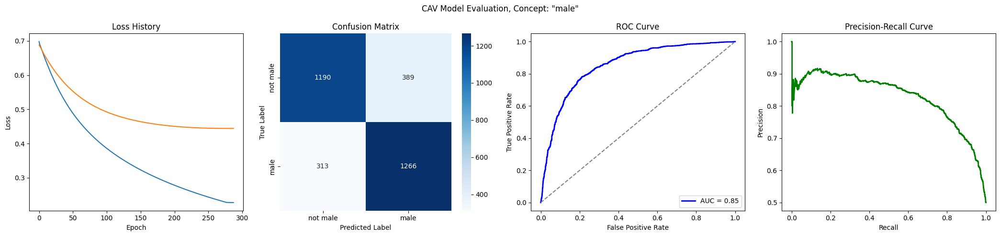

Training run 42/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6912
Epoch 1 Validation Loss: 0.6890
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6369
Epoch 11 Validation Loss: 0.6578
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5901
Epoch 21 Validation Loss: 0.6314
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5501
Epoch 31 Validation Loss: 0.6092
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5159
Epoch 41 Validation Loss: 0.5906
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4863
Epoch 51 Validation Loss: 0.5750
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4605
Epoch 61 Validation Loss: 0.5620
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4377
Epoch 71 Validation Loss: 0.5512
Model saved to trai

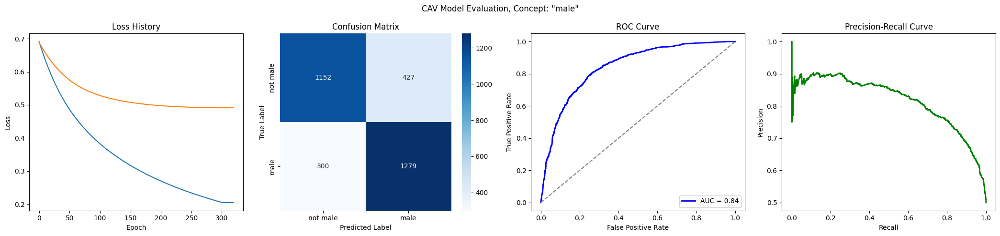

Training run 43/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6928
Epoch 1 Validation Loss: 0.6881
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6302
Epoch 11 Validation Loss: 0.6548
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5776
Epoch 21 Validation Loss: 0.6277
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5337
Epoch 31 Validation Loss: 0.6062
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4967
Epoch 41 Validation Loss: 0.5893
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4652
Epoch 51 Validation Loss: 0.5760
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4379
Epoch 61 Validation Loss: 0.5653
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4139
Epoch 71 Validation Loss: 0.5566
Model saved to trai

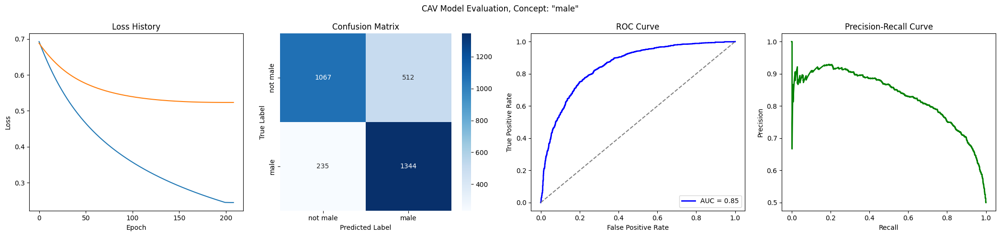

Training run 44/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6900
Epoch 1 Validation Loss: 0.6877
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6357
Epoch 11 Validation Loss: 0.6563
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5897
Epoch 21 Validation Loss: 0.6303
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5510
Epoch 31 Validation Loss: 0.6088
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5182
Epoch 41 Validation Loss: 0.5907
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4900
Epoch 51 Validation Loss: 0.5755
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4653
Epoch 61 Validation Loss: 0.5625
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4434
Epoch 71 Validation Loss: 0.5514
Model saved to trai

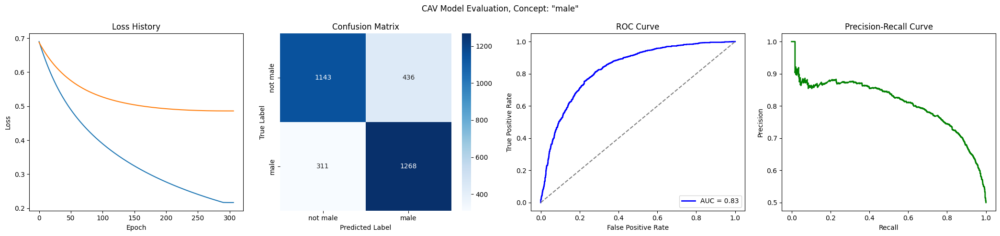

Training run 45/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6410
Epoch 11 Validation Loss: 0.6532
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5942
Epoch 21 Validation Loss: 0.6202
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5548
Epoch 31 Validation Loss: 0.5935
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5213
Epoch 41 Validation Loss: 0.5717
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4927
Epoch 51 Validation Loss: 0.5540
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4678
Epoch 61 Validation Loss: 0.5394
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4460
Epoch 71 Validation Loss: 0.5272
Model saved to trai

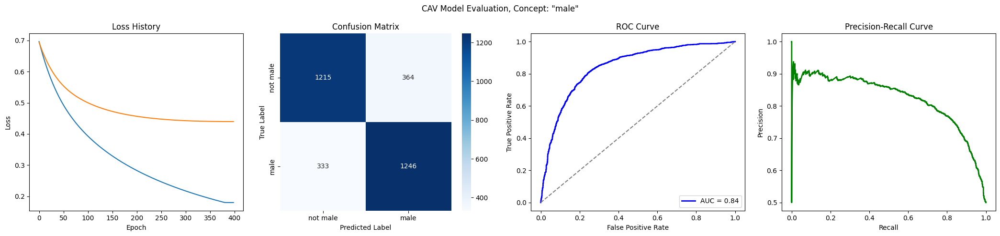

Training run 46/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6363
Epoch 11 Validation Loss: 0.6523
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5856
Epoch 21 Validation Loss: 0.6226
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5426
Epoch 31 Validation Loss: 0.5986
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5063
Epoch 41 Validation Loss: 0.5794
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4754
Epoch 51 Validation Loss: 0.5641
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4489
Epoch 61 Validation Loss: 0.5517
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4257
Epoch 71 Validation Loss: 0.5414
Model saved to trai

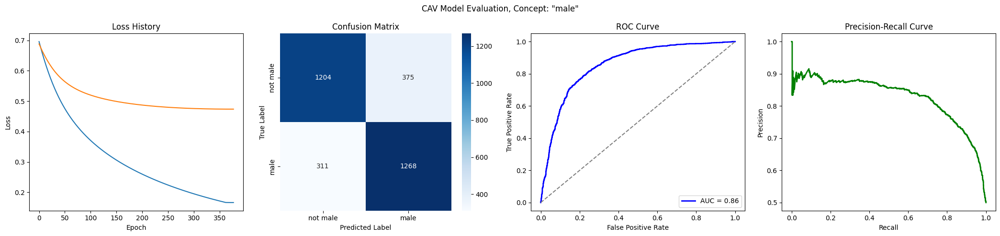

Training run 47/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7021
Epoch 1 Validation Loss: 0.6910
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6489
Epoch 11 Validation Loss: 0.6565
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6019
Epoch 21 Validation Loss: 0.6260
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5614
Epoch 31 Validation Loss: 0.6005
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5267
Epoch 41 Validation Loss: 0.5794
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4969
Epoch 51 Validation Loss: 0.5618
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4710
Epoch 61 Validation Loss: 0.5471
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4482
Epoch 71 Validation Loss: 0.5345
Model saved to trai

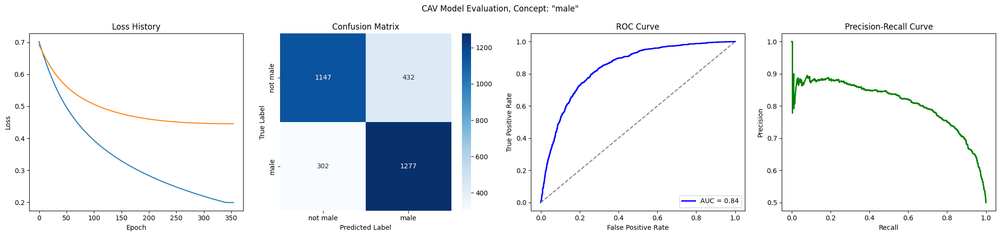

Training run 48/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6888
Epoch 1 Validation Loss: 0.6867
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6340
Epoch 11 Validation Loss: 0.6568
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5852
Epoch 21 Validation Loss: 0.6307
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5426
Epoch 31 Validation Loss: 0.6089
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5058
Epoch 41 Validation Loss: 0.5906
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4740
Epoch 51 Validation Loss: 0.5755
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4462
Epoch 61 Validation Loss: 0.5629
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4217
Epoch 71 Validation Loss: 0.5524
Model saved to trai

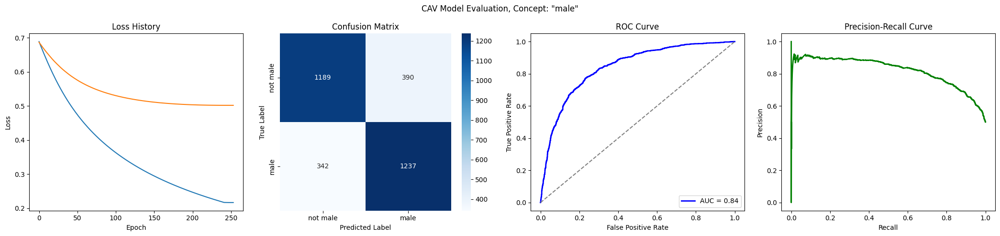

Training run 49/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6333
Epoch 11 Validation Loss: 0.6511
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5800
Epoch 21 Validation Loss: 0.6173
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5347
Epoch 31 Validation Loss: 0.5896
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4960
Epoch 41 Validation Loss: 0.5667
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4628
Epoch 51 Validation Loss: 0.5478
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4340
Epoch 61 Validation Loss: 0.5320
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4088
Epoch 71 Validation Loss: 0.5187
Model saved to trai

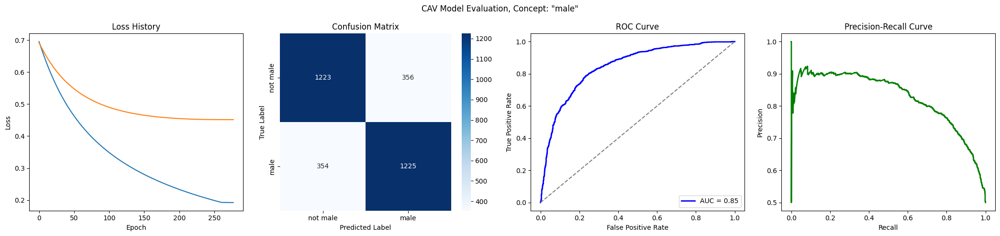

Training run 50/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6966
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6465
Epoch 11 Validation Loss: 0.6558
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6034
Epoch 21 Validation Loss: 0.6259
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5666
Epoch 31 Validation Loss: 0.6014
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5349
Epoch 41 Validation Loss: 0.5809
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5072
Epoch 51 Validation Loss: 0.5636
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4826
Epoch 61 Validation Loss: 0.5489
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4607
Epoch 71 Validation Loss: 0.5363
Model saved to trai

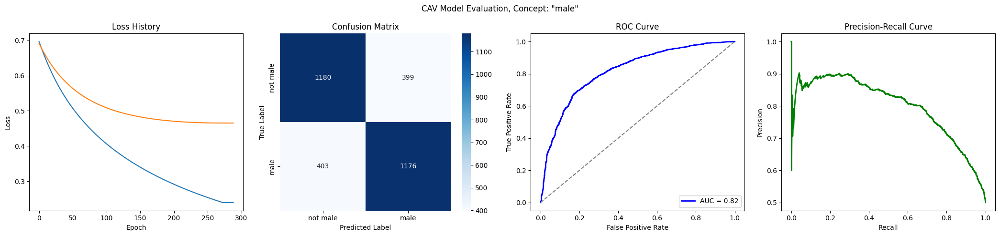

Training run 51/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6959
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6344
Epoch 11 Validation Loss: 0.6612
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5806
Epoch 21 Validation Loss: 0.6366
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5346
Epoch 31 Validation Loss: 0.6159
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.4955
Epoch 41 Validation Loss: 0.5985
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4620
Epoch 51 Validation Loss: 0.5837
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4331
Epoch 61 Validation Loss: 0.5711
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4078
Epoch 71 Validation Loss: 0.5603
Model saved to trai

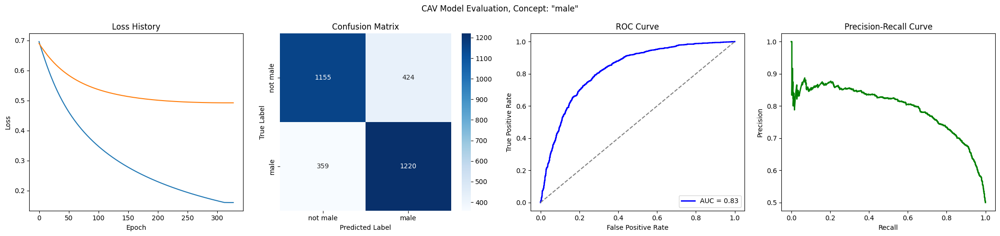

Training run 52/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6905
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6352
Epoch 11 Validation Loss: 0.6573
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5861
Epoch 21 Validation Loss: 0.6282
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5441
Epoch 31 Validation Loss: 0.6034
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5083
Epoch 41 Validation Loss: 0.5826
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4775
Epoch 51 Validation Loss: 0.5653
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4508
Epoch 61 Validation Loss: 0.5508
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4274
Epoch 71 Validation Loss: 0.5386
Model saved to trai

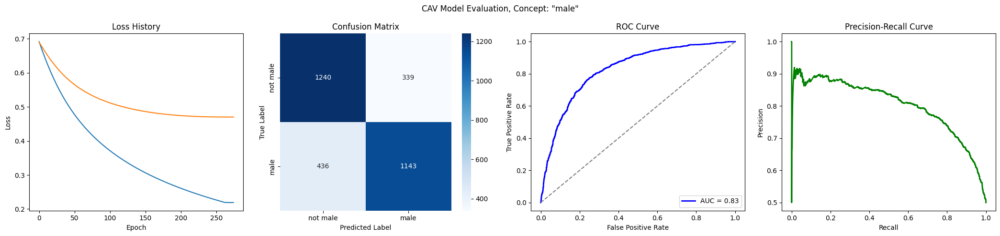

Training run 53/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6921
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6436
Epoch 11 Validation Loss: 0.6551
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6003
Epoch 21 Validation Loss: 0.6239
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5622
Epoch 31 Validation Loss: 0.5967
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5289
Epoch 41 Validation Loss: 0.5735
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4997
Epoch 51 Validation Loss: 0.5537
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4739
Epoch 61 Validation Loss: 0.5368
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4510
Epoch 71 Validation Loss: 0.5225
Model saved to trai

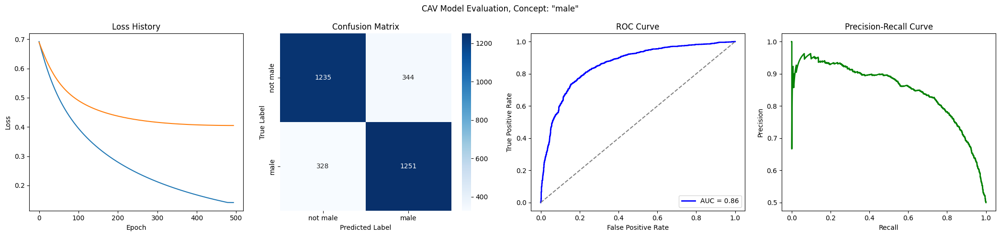

Training run 54/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6934
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6403
Epoch 11 Validation Loss: 0.6563
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5946
Epoch 21 Validation Loss: 0.6281
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5556
Epoch 31 Validation Loss: 0.6052
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5220
Epoch 41 Validation Loss: 0.5869
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4928
Epoch 51 Validation Loss: 0.5720
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4672
Epoch 61 Validation Loss: 0.5599
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4446
Epoch 71 Validation Loss: 0.5498
Model saved to trai

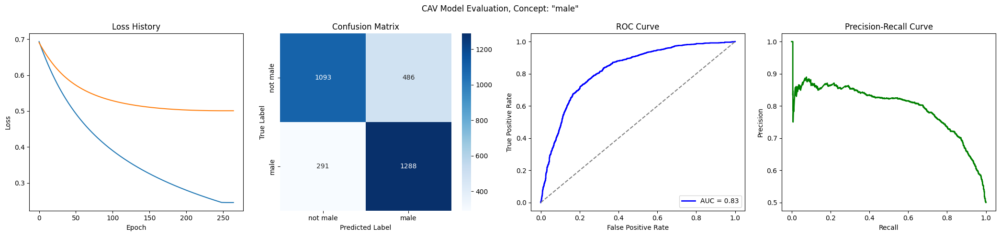

Training run 55/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6984
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6418
Epoch 11 Validation Loss: 0.6615
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5923
Epoch 21 Validation Loss: 0.6359
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5488
Epoch 31 Validation Loss: 0.6147
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5112
Epoch 41 Validation Loss: 0.5969
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4788
Epoch 51 Validation Loss: 0.5822
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4507
Epoch 61 Validation Loss: 0.5702
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4262
Epoch 71 Validation Loss: 0.5606
Model saved to trai

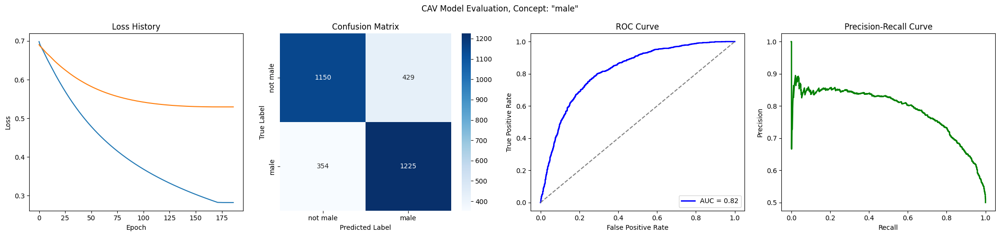

Training run 56/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6968
Epoch 1 Validation Loss: 0.6911
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6431
Epoch 11 Validation Loss: 0.6607
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5953
Epoch 21 Validation Loss: 0.6335
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5530
Epoch 31 Validation Loss: 0.6100
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5161
Epoch 41 Validation Loss: 0.5898
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4837
Epoch 51 Validation Loss: 0.5731
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4552
Epoch 61 Validation Loss: 0.5592
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4298
Epoch 71 Validation Loss: 0.5472
Model saved to trai

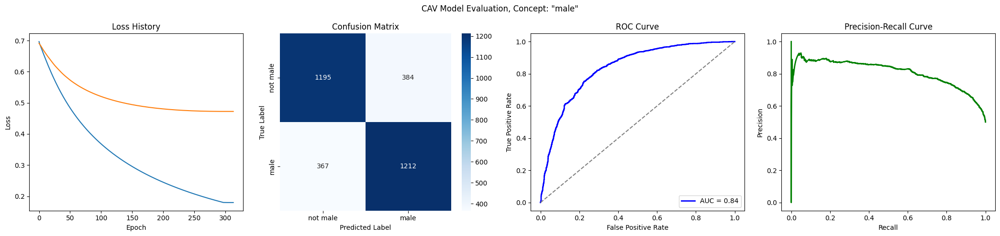

Training run 57/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6857
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6386
Epoch 11 Validation Loss: 0.6602
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5889
Epoch 21 Validation Loss: 0.6390
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5466
Epoch 31 Validation Loss: 0.6207
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5106
Epoch 41 Validation Loss: 0.6043
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4796
Epoch 51 Validation Loss: 0.5901
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4526
Epoch 61 Validation Loss: 0.5780
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4289
Epoch 71 Validation Loss: 0.5677
Model saved to trai

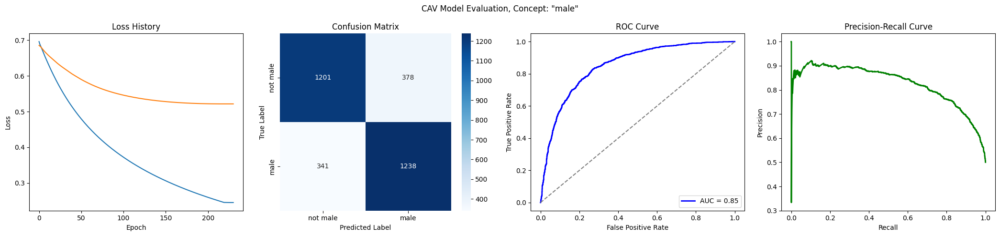

Training run 58/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7023
Epoch 1 Validation Loss: 0.6929
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6443
Epoch 11 Validation Loss: 0.6605
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5952
Epoch 21 Validation Loss: 0.6316
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5524
Epoch 31 Validation Loss: 0.6069
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5156
Epoch 41 Validation Loss: 0.5866
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4839
Epoch 51 Validation Loss: 0.5699
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4562
Epoch 61 Validation Loss: 0.5559
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4317
Epoch 71 Validation Loss: 0.5444
Model saved to trai

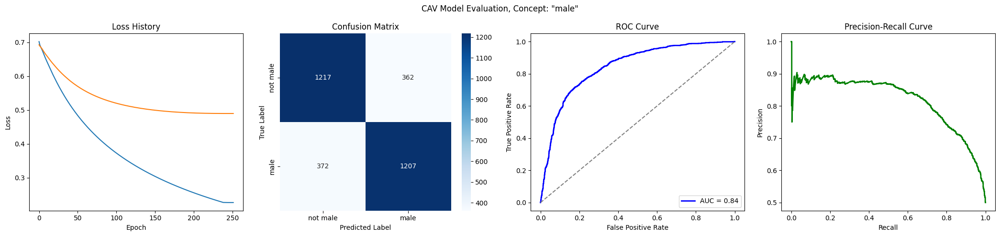

Training run 59/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6965
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6452
Epoch 11 Validation Loss: 0.6586
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5993
Epoch 21 Validation Loss: 0.6298
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5591
Epoch 31 Validation Loss: 0.6056
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5242
Epoch 41 Validation Loss: 0.5853
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4937
Epoch 51 Validation Loss: 0.5684
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4670
Epoch 61 Validation Loss: 0.5545
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4434
Epoch 71 Validation Loss: 0.5430
Model saved to trai

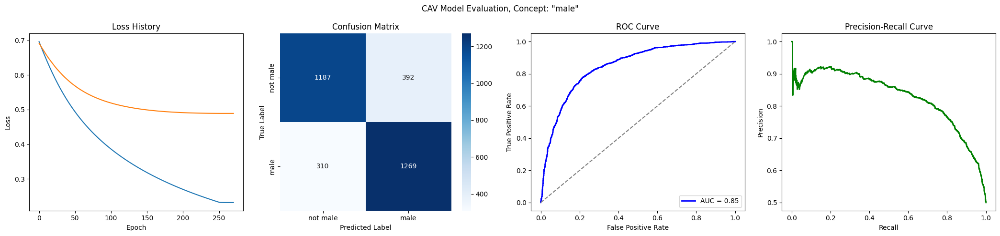

Training run 60/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6893
Epoch 1 Validation Loss: 0.6812
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6372
Epoch 11 Validation Loss: 0.6484
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5933
Epoch 21 Validation Loss: 0.6199
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5556
Epoch 31 Validation Loss: 0.5943
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5229
Epoch 41 Validation Loss: 0.5716
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4944
Epoch 51 Validation Loss: 0.5518
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4691
Epoch 61 Validation Loss: 0.5349
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4467
Epoch 71 Validation Loss: 0.5206
Model saved to trai

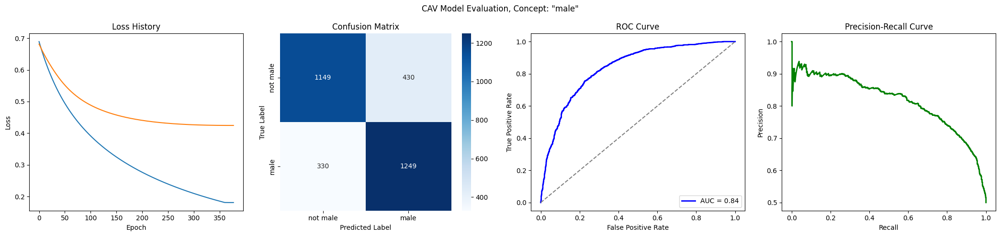

Training run 61/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6925
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6456
Epoch 11 Validation Loss: 0.6634
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6055
Epoch 21 Validation Loss: 0.6417
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5707
Epoch 31 Validation Loss: 0.6219
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5401
Epoch 41 Validation Loss: 0.6039
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5133
Epoch 51 Validation Loss: 0.5884
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4895
Epoch 61 Validation Loss: 0.5757
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4682
Epoch 71 Validation Loss: 0.5655
Model saved to trai

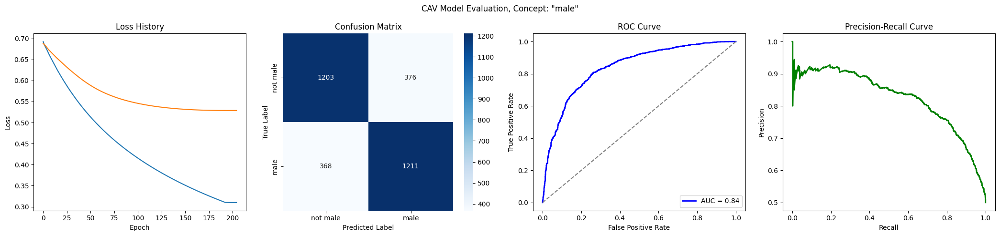

Training run 62/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6975
Epoch 1 Validation Loss: 0.6904
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6448
Epoch 11 Validation Loss: 0.6591
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5995
Epoch 21 Validation Loss: 0.6327
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5608
Epoch 31 Validation Loss: 0.6109
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5278
Epoch 41 Validation Loss: 0.5930
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4993
Epoch 51 Validation Loss: 0.5783
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4745
Epoch 61 Validation Loss: 0.5660
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4526
Epoch 71 Validation Loss: 0.5559
Model saved to trai

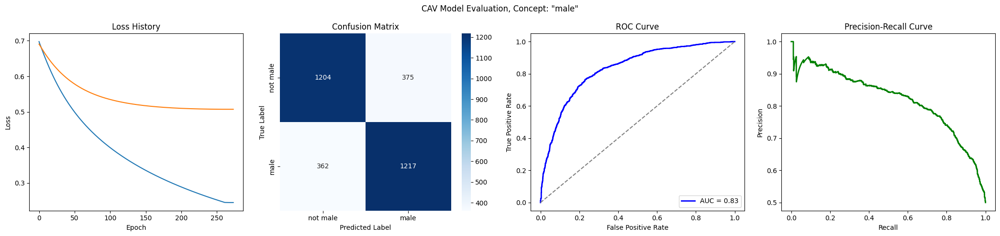

Training run 63/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6983
Epoch 1 Validation Loss: 0.6901
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6418
Epoch 11 Validation Loss: 0.6476
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5927
Epoch 21 Validation Loss: 0.6109
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5504
Epoch 31 Validation Loss: 0.5802
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5142
Epoch 41 Validation Loss: 0.5547
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4829
Epoch 51 Validation Loss: 0.5332
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4556
Epoch 61 Validation Loss: 0.5150
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4316
Epoch 71 Validation Loss: 0.4996
Model saved to trai

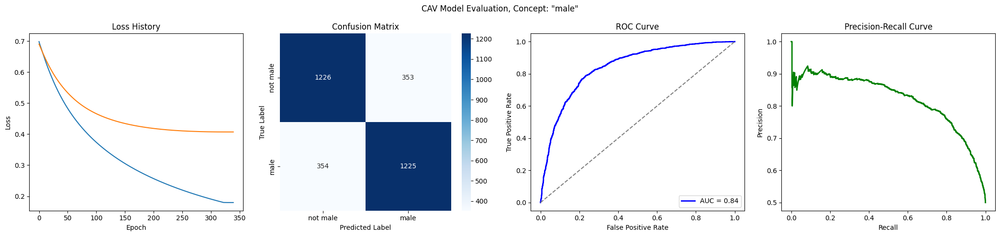

Training run 64/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6980
Epoch 1 Validation Loss: 0.6891
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6424
Epoch 11 Validation Loss: 0.6524
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5944
Epoch 21 Validation Loss: 0.6218
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5531
Epoch 31 Validation Loss: 0.5968
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5176
Epoch 41 Validation Loss: 0.5761
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4870
Epoch 51 Validation Loss: 0.5587
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4603
Epoch 61 Validation Loss: 0.5441
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4369
Epoch 71 Validation Loss: 0.5318
Model saved to trai

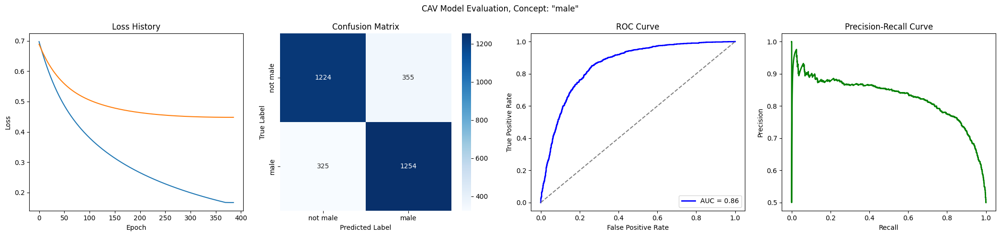

Training run 65/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7034
Epoch 1 Validation Loss: 0.6917
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6521
Epoch 11 Validation Loss: 0.6549
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6079
Epoch 21 Validation Loss: 0.6203
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5685
Epoch 31 Validation Loss: 0.5914
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5340
Epoch 41 Validation Loss: 0.5671
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5038
Epoch 51 Validation Loss: 0.5470
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4771
Epoch 61 Validation Loss: 0.5309
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4533
Epoch 71 Validation Loss: 0.5178
Model saved to trai

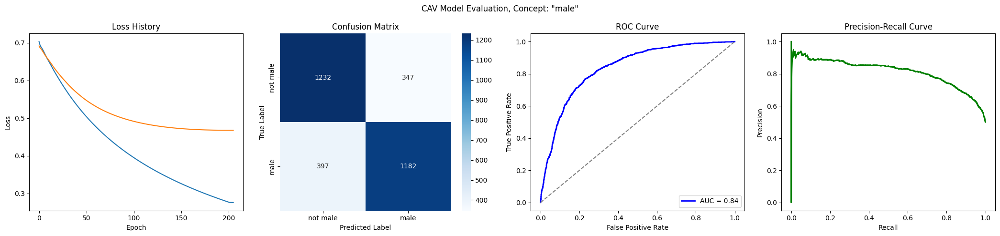

Training run 66/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6916
Epoch 1 Validation Loss: 0.6858
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6390
Epoch 11 Validation Loss: 0.6576
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5929
Epoch 21 Validation Loss: 0.6345
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5532
Epoch 31 Validation Loss: 0.6159
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5190
Epoch 41 Validation Loss: 0.6011
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4895
Epoch 51 Validation Loss: 0.5896
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4637
Epoch 61 Validation Loss: 0.5806
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4410
Epoch 71 Validation Loss: 0.5734
Model saved to trai

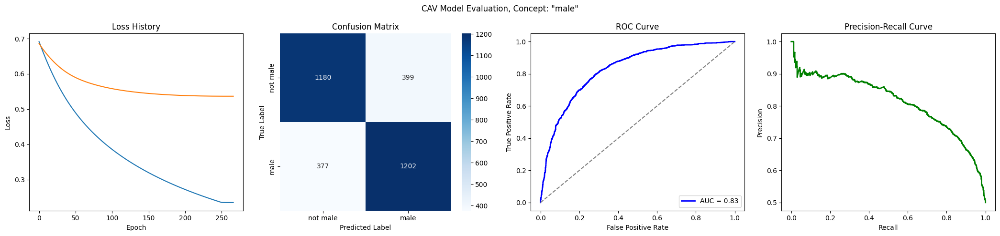

Training run 67/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6895
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6416
Epoch 11 Validation Loss: 0.6569
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5954
Epoch 21 Validation Loss: 0.6281
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5548
Epoch 31 Validation Loss: 0.6034
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5194
Epoch 41 Validation Loss: 0.5823
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4885
Epoch 51 Validation Loss: 0.5652
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4615
Epoch 61 Validation Loss: 0.5514
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4377
Epoch 71 Validation Loss: 0.5402
Model saved to trai

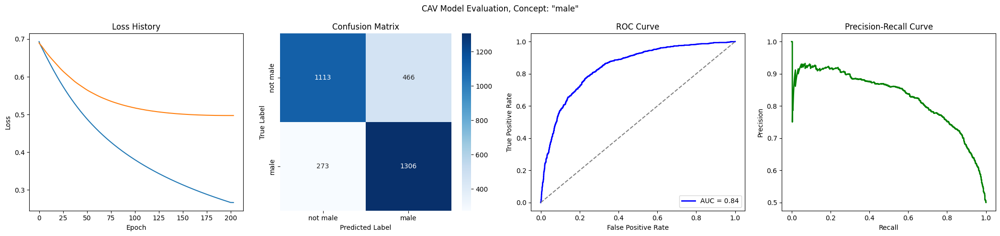

Training run 68/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6960
Epoch 1 Validation Loss: 0.6886
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6381
Epoch 11 Validation Loss: 0.6531
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5891
Epoch 21 Validation Loss: 0.6210
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5452
Epoch 31 Validation Loss: 0.5937
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5069
Epoch 41 Validation Loss: 0.5710
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4737
Epoch 51 Validation Loss: 0.5528
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4447
Epoch 61 Validation Loss: 0.5382
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4193
Epoch 71 Validation Loss: 0.5264
Model saved to trai

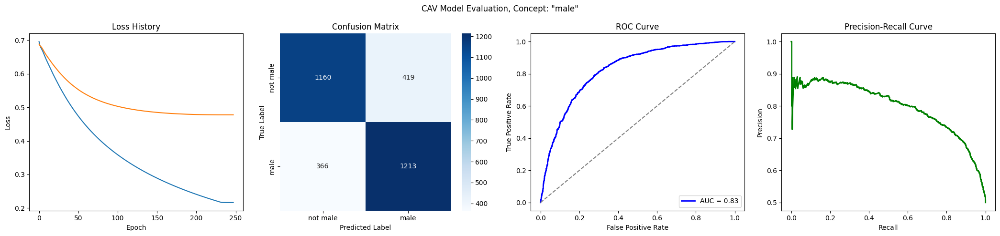

Training run 69/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6962
Epoch 1 Validation Loss: 0.6923
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6390
Epoch 11 Validation Loss: 0.6519
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5917
Epoch 21 Validation Loss: 0.6195
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5524
Epoch 31 Validation Loss: 0.5938
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5191
Epoch 41 Validation Loss: 0.5731
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4905
Epoch 51 Validation Loss: 0.5561
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4656
Epoch 61 Validation Loss: 0.5419
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4435
Epoch 71 Validation Loss: 0.5300
Model saved to trai

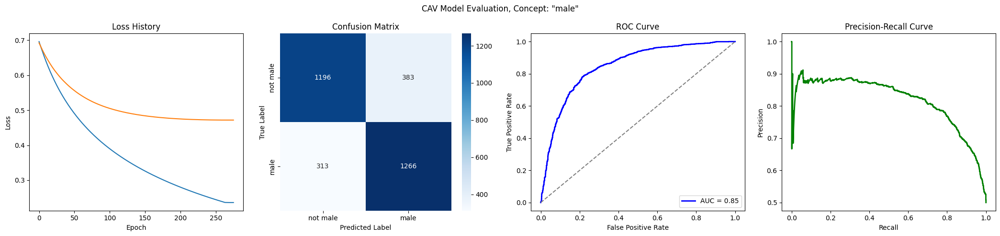

Training run 70/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7042
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6520
Epoch 11 Validation Loss: 0.6651
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6094
Epoch 21 Validation Loss: 0.6409
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5713
Epoch 31 Validation Loss: 0.6190
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5377
Epoch 41 Validation Loss: 0.6000
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5083
Epoch 51 Validation Loss: 0.5839
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4824
Epoch 61 Validation Loss: 0.5703
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4591
Epoch 71 Validation Loss: 0.5590
Model saved to trai

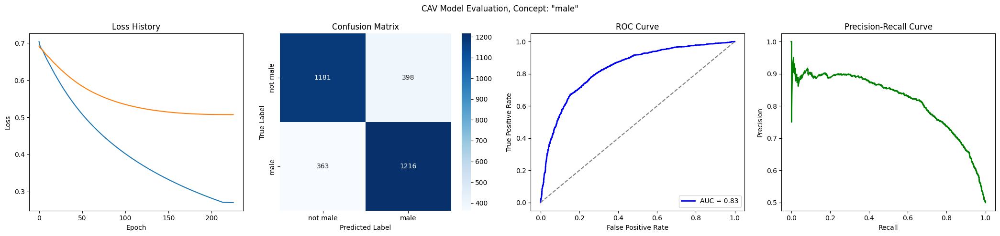

Training run 71/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6957
Epoch 1 Validation Loss: 0.6937
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6428
Epoch 11 Validation Loss: 0.6551
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5962
Epoch 21 Validation Loss: 0.6219
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5559
Epoch 31 Validation Loss: 0.5944
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5210
Epoch 41 Validation Loss: 0.5719
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4905
Epoch 51 Validation Loss: 0.5535
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4638
Epoch 61 Validation Loss: 0.5385
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4400
Epoch 71 Validation Loss: 0.5262
Model saved to trai

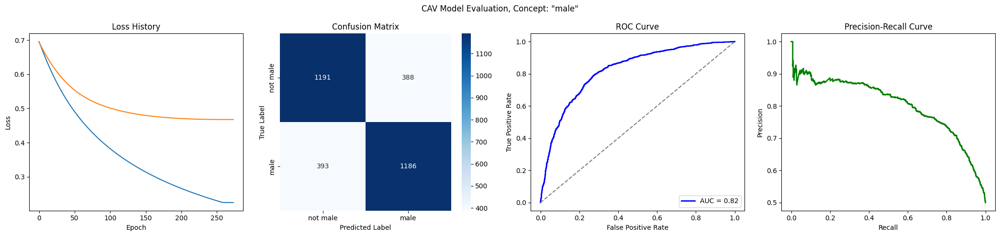

Training run 72/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6987
Epoch 1 Validation Loss: 0.6934
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6447
Epoch 11 Validation Loss: 0.6658
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5966
Epoch 21 Validation Loss: 0.6412
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5546
Epoch 31 Validation Loss: 0.6201
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5181
Epoch 41 Validation Loss: 0.6019
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4864
Epoch 51 Validation Loss: 0.5869
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4586
Epoch 61 Validation Loss: 0.5745
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4342
Epoch 71 Validation Loss: 0.5641
Model saved to trai

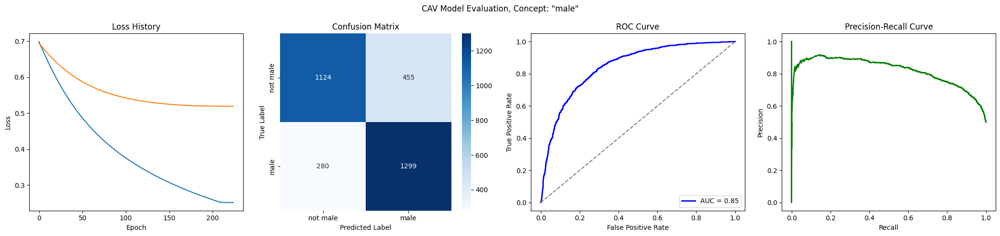

Training run 73/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6876
Epoch 1 Validation Loss: 0.6869
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6317
Epoch 11 Validation Loss: 0.6541
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5832
Epoch 21 Validation Loss: 0.6265
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5416
Epoch 31 Validation Loss: 0.6041
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5060
Epoch 41 Validation Loss: 0.5866
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4753
Epoch 51 Validation Loss: 0.5731
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4487
Epoch 61 Validation Loss: 0.5624
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4254
Epoch 71 Validation Loss: 0.5535
Model saved to trai

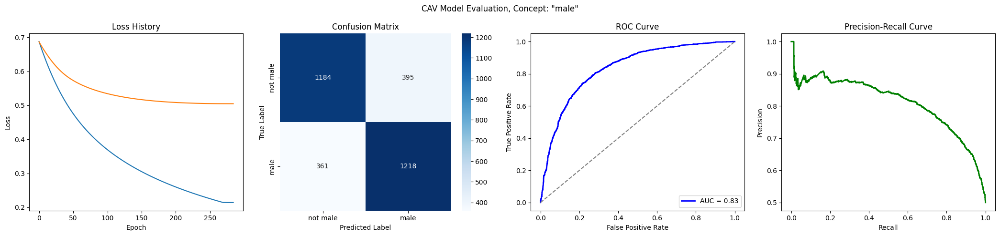

Training run 74/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6971
Epoch 1 Validation Loss: 0.6942
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6419
Epoch 11 Validation Loss: 0.6654
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5943
Epoch 21 Validation Loss: 0.6408
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5537
Epoch 31 Validation Loss: 0.6197
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5189
Epoch 41 Validation Loss: 0.6016
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4889
Epoch 51 Validation Loss: 0.5860
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4626
Epoch 61 Validation Loss: 0.5726
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4394
Epoch 71 Validation Loss: 0.5610
Model saved to trai

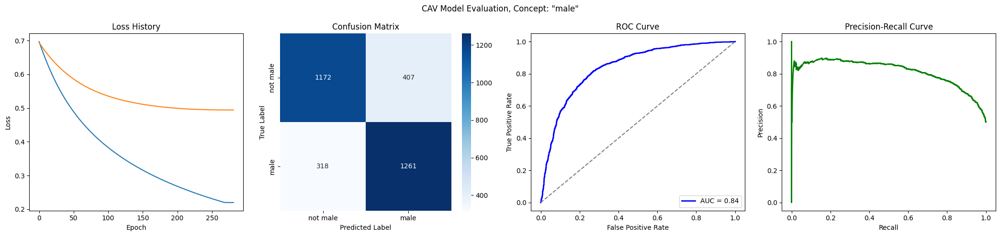

Training run 75/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7062
Epoch 1 Validation Loss: 0.6889
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6532
Epoch 11 Validation Loss: 0.6625
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6142
Epoch 21 Validation Loss: 0.6401
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5797
Epoch 31 Validation Loss: 0.6188
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5495
Epoch 41 Validation Loss: 0.5993
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5229
Epoch 51 Validation Loss: 0.5815
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4993
Epoch 61 Validation Loss: 0.5659
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4782
Epoch 71 Validation Loss: 0.5522
Model saved to trai

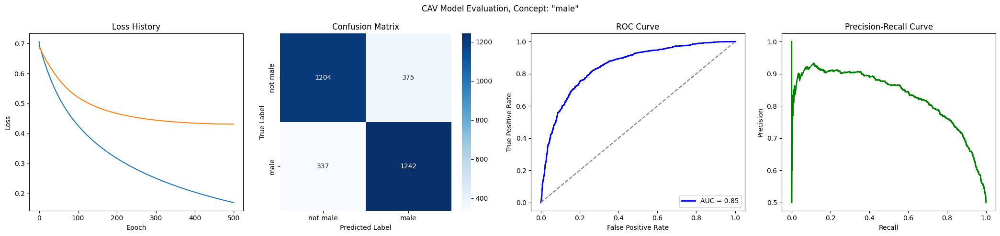

Training run 76/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7065
Epoch 1 Validation Loss: 0.6945
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6513
Epoch 11 Validation Loss: 0.6618
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6060
Epoch 21 Validation Loss: 0.6325
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5656
Epoch 31 Validation Loss: 0.6071
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5303
Epoch 41 Validation Loss: 0.5849
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4996
Epoch 51 Validation Loss: 0.5662
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4729
Epoch 61 Validation Loss: 0.5502
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4495
Epoch 71 Validation Loss: 0.5365
Model saved to trai

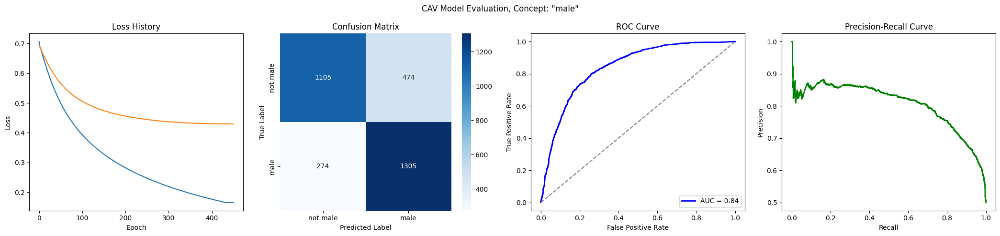

Training run 77/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6918
Epoch 1 Validation Loss: 0.6884
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6372
Epoch 11 Validation Loss: 0.6523
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5915
Epoch 21 Validation Loss: 0.6223
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5533
Epoch 31 Validation Loss: 0.5972
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5210
Epoch 41 Validation Loss: 0.5759
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4930
Epoch 51 Validation Loss: 0.5578
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4686
Epoch 61 Validation Loss: 0.5424
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4469
Epoch 71 Validation Loss: 0.5294
Model saved to trai

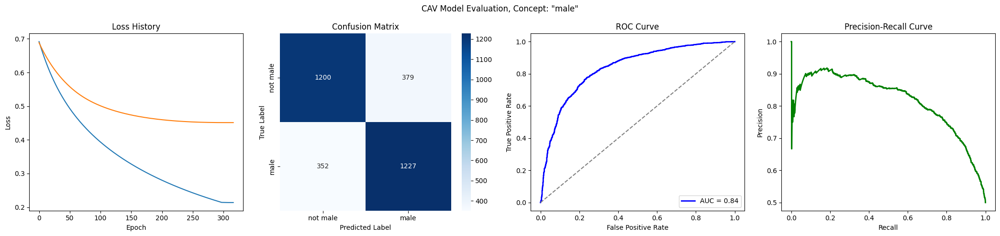

Training run 78/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7006
Epoch 1 Validation Loss: 0.6930
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6489
Epoch 11 Validation Loss: 0.6624
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6045
Epoch 21 Validation Loss: 0.6340
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5655
Epoch 31 Validation Loss: 0.6098
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5318
Epoch 41 Validation Loss: 0.5892
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5027
Epoch 51 Validation Loss: 0.5718
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4773
Epoch 61 Validation Loss: 0.5570
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4549
Epoch 71 Validation Loss: 0.5444
Model saved to trai

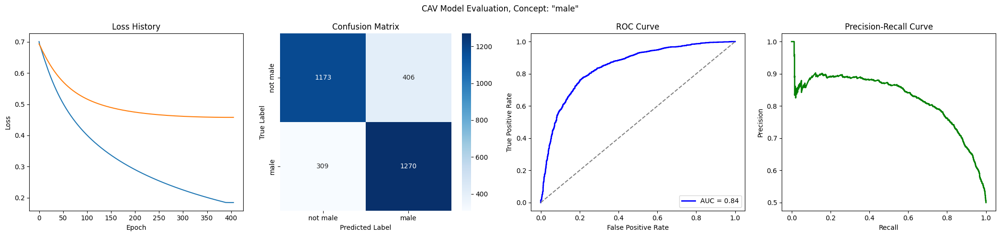

Training run 79/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6964
Epoch 1 Validation Loss: 0.6939
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6425
Epoch 11 Validation Loss: 0.6686
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5952
Epoch 21 Validation Loss: 0.6454
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5545
Epoch 31 Validation Loss: 0.6250
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5195
Epoch 41 Validation Loss: 0.6073
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4892
Epoch 51 Validation Loss: 0.5921
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4628
Epoch 61 Validation Loss: 0.5791
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4395
Epoch 71 Validation Loss: 0.5679
Model saved to trai

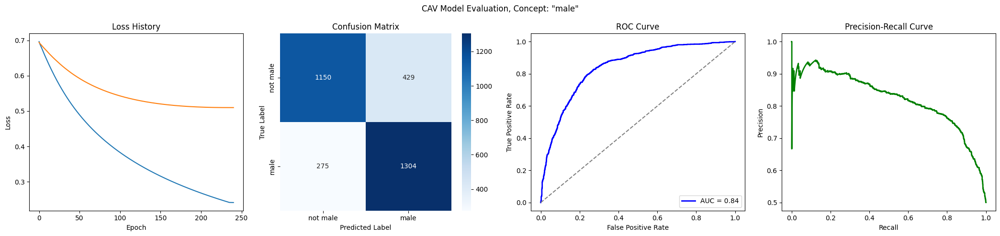

Training run 80/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6924
Epoch 1 Validation Loss: 0.6879
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6388
Epoch 11 Validation Loss: 0.6590
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5915
Epoch 21 Validation Loss: 0.6344
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5510
Epoch 31 Validation Loss: 0.6145
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5165
Epoch 41 Validation Loss: 0.5984
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4868
Epoch 51 Validation Loss: 0.5855
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4611
Epoch 61 Validation Loss: 0.5749
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4385
Epoch 71 Validation Loss: 0.5662
Model saved to trai

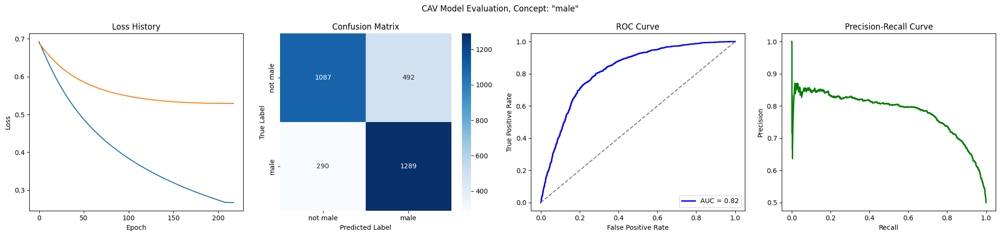

Training run 81/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6941
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6332
Epoch 11 Validation Loss: 0.6645
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5813
Epoch 21 Validation Loss: 0.6398
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5374
Epoch 31 Validation Loss: 0.6190
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5001
Epoch 41 Validation Loss: 0.6021
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4682
Epoch 51 Validation Loss: 0.5889
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4406
Epoch 61 Validation Loss: 0.5788
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4164
Epoch 71 Validation Loss: 0.5710
Model saved to trai

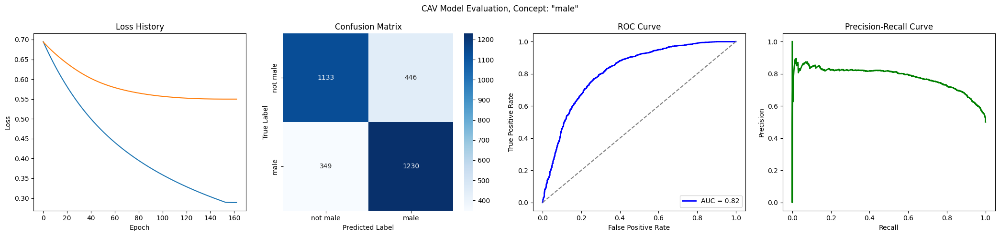

Training run 82/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6925
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6397
Epoch 11 Validation Loss: 0.6666
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5902
Epoch 21 Validation Loss: 0.6451
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5480
Epoch 31 Validation Loss: 0.6258
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5125
Epoch 41 Validation Loss: 0.6094
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4823
Epoch 51 Validation Loss: 0.5951
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4562
Epoch 61 Validation Loss: 0.5826
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4333
Epoch 71 Validation Loss: 0.5720
Model saved to trai

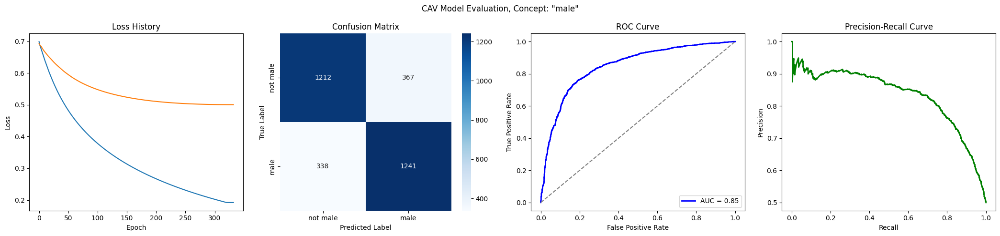

Training run 83/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6963
Epoch 1 Validation Loss: 0.6922
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6402
Epoch 11 Validation Loss: 0.6579
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5912
Epoch 21 Validation Loss: 0.6294
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5486
Epoch 31 Validation Loss: 0.6059
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5115
Epoch 41 Validation Loss: 0.5869
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4791
Epoch 51 Validation Loss: 0.5716
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4508
Epoch 61 Validation Loss: 0.5594
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4258
Epoch 71 Validation Loss: 0.5496
Model saved to trai

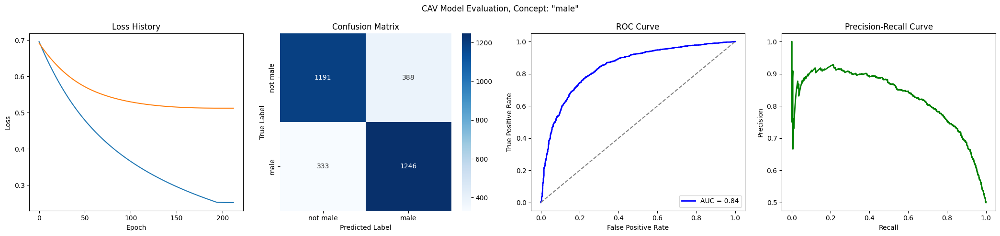

Training run 84/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6956
Epoch 1 Validation Loss: 0.6932
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6390
Epoch 11 Validation Loss: 0.6631
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5913
Epoch 21 Validation Loss: 0.6345
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5507
Epoch 31 Validation Loss: 0.6078
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5161
Epoch 41 Validation Loss: 0.5840
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4862
Epoch 51 Validation Loss: 0.5637
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4599
Epoch 61 Validation Loss: 0.5463
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4366
Epoch 71 Validation Loss: 0.5312
Model saved to trai

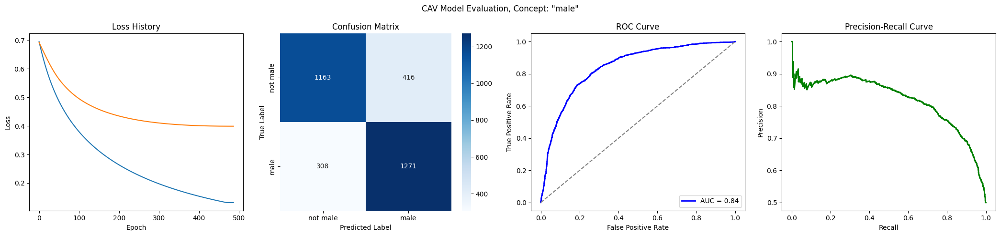

Training run 85/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6918
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6463
Epoch 11 Validation Loss: 0.6580
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6036
Epoch 21 Validation Loss: 0.6280
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5663
Epoch 31 Validation Loss: 0.6027
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5337
Epoch 41 Validation Loss: 0.5815
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5053
Epoch 51 Validation Loss: 0.5637
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4803
Epoch 61 Validation Loss: 0.5487
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4582
Epoch 71 Validation Loss: 0.5360
Model saved to trai

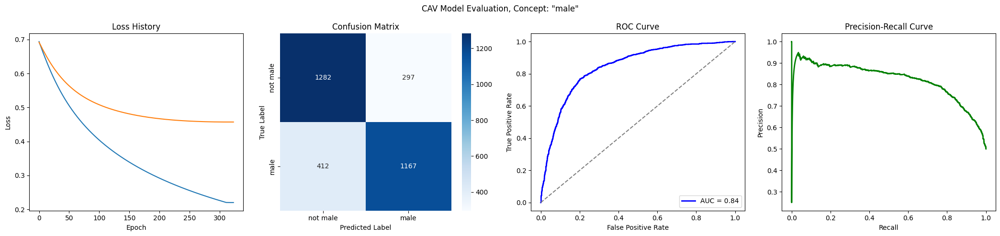

Training run 86/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6930
Epoch 1 Validation Loss: 0.6843
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6419
Epoch 11 Validation Loss: 0.6468
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5966
Epoch 21 Validation Loss: 0.6142
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5571
Epoch 31 Validation Loss: 0.5870
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5229
Epoch 41 Validation Loss: 0.5643
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4932
Epoch 51 Validation Loss: 0.5455
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4671
Epoch 61 Validation Loss: 0.5299
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4440
Epoch 71 Validation Loss: 0.5168
Model saved to trai

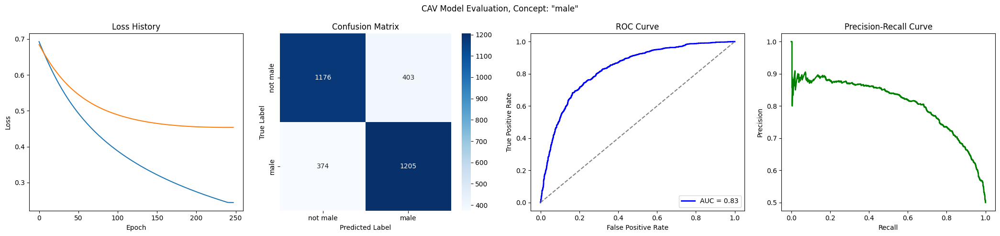

Training run 87/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6938
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6455
Epoch 11 Validation Loss: 0.6597
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6029
Epoch 21 Validation Loss: 0.6345
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5656
Epoch 31 Validation Loss: 0.6121
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5331
Epoch 41 Validation Loss: 0.5923
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5049
Epoch 51 Validation Loss: 0.5757
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4801
Epoch 61 Validation Loss: 0.5613
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4580
Epoch 71 Validation Loss: 0.5486
Model saved to trai

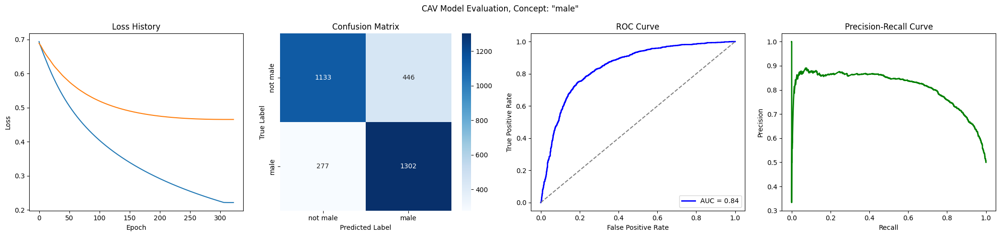

Training run 88/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6977
Epoch 1 Validation Loss: 0.6966
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6378
Epoch 11 Validation Loss: 0.6611
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5859
Epoch 21 Validation Loss: 0.6306
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5420
Epoch 31 Validation Loss: 0.6053
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5048
Epoch 41 Validation Loss: 0.5847
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4732
Epoch 51 Validation Loss: 0.5678
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4460
Epoch 61 Validation Loss: 0.5537
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4224
Epoch 71 Validation Loss: 0.5421
Model saved to trai

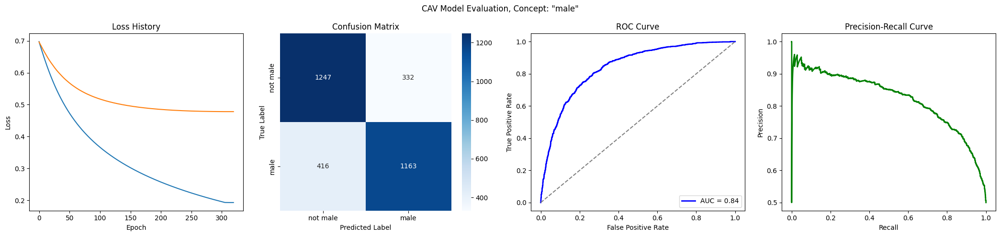

Training run 89/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6933
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6372
Epoch 11 Validation Loss: 0.6507
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5891
Epoch 21 Validation Loss: 0.6188
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5480
Epoch 31 Validation Loss: 0.5914
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5125
Epoch 41 Validation Loss: 0.5678
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4814
Epoch 51 Validation Loss: 0.5474
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4540
Epoch 61 Validation Loss: 0.5298
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4296
Epoch 71 Validation Loss: 0.5146
Model saved to trai

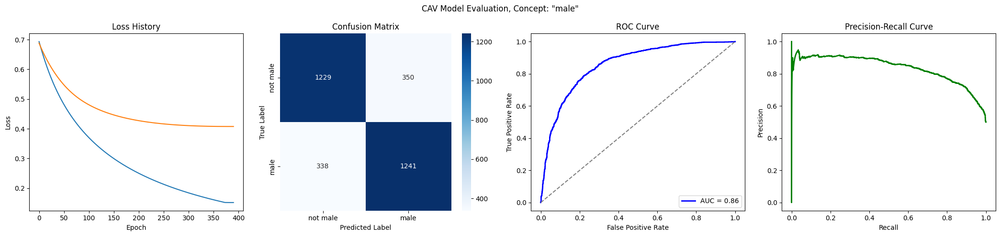

Training run 90/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6937
Epoch 1 Validation Loss: 0.6899
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6440
Epoch 11 Validation Loss: 0.6744
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6009
Epoch 21 Validation Loss: 0.6611
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5637
Epoch 31 Validation Loss: 0.6482
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5316
Epoch 41 Validation Loss: 0.6358
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5035
Epoch 51 Validation Loss: 0.6246
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4787
Epoch 61 Validation Loss: 0.6147
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4565
Epoch 71 Validation Loss: 0.6063
Model saved to trai

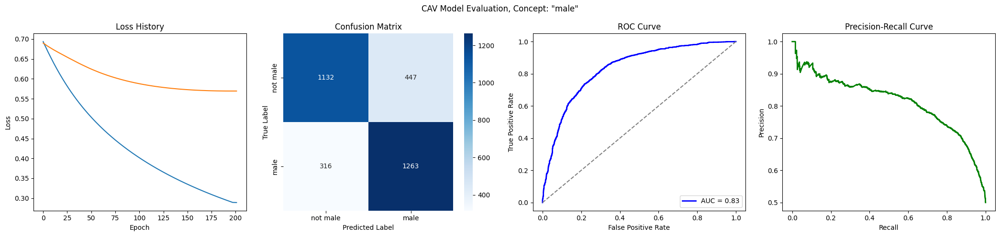

Training run 91/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6927
Epoch 1 Validation Loss: 0.6879
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6405
Epoch 11 Validation Loss: 0.6526
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5933
Epoch 21 Validation Loss: 0.6208
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5515
Epoch 31 Validation Loss: 0.5931
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5149
Epoch 41 Validation Loss: 0.5694
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4829
Epoch 51 Validation Loss: 0.5493
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4548
Epoch 61 Validation Loss: 0.5322
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4299
Epoch 71 Validation Loss: 0.5176
Model saved to trai

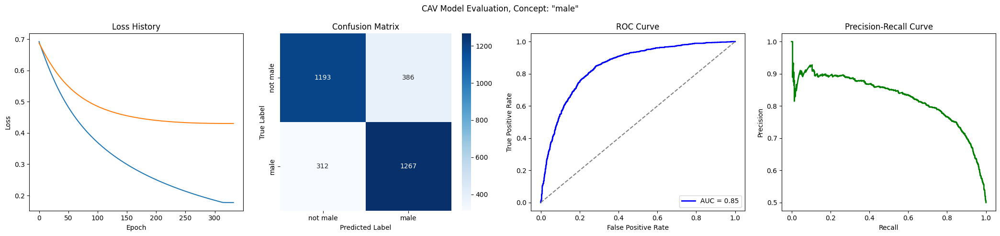

Training run 92/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6940
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6356
Epoch 11 Validation Loss: 0.6569
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5865
Epoch 21 Validation Loss: 0.6296
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5454
Epoch 31 Validation Loss: 0.6066
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5106
Epoch 41 Validation Loss: 0.5879
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4809
Epoch 51 Validation Loss: 0.5727
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4552
Epoch 61 Validation Loss: 0.5604
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4325
Epoch 71 Validation Loss: 0.5504
Model saved to trai

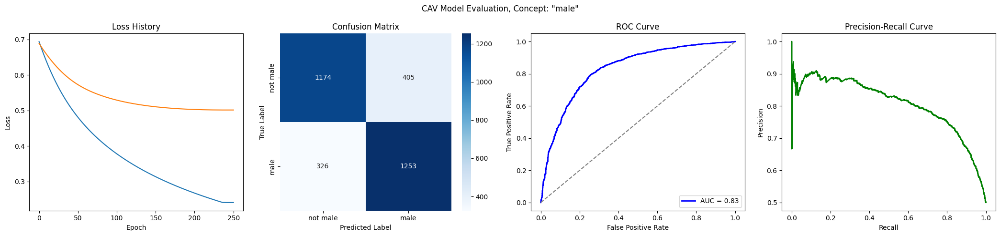

Training run 93/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6896
Epoch 1 Validation Loss: 0.6914
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6332
Epoch 11 Validation Loss: 0.6598
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5837
Epoch 21 Validation Loss: 0.6315
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5406
Epoch 31 Validation Loss: 0.6069
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5034
Epoch 41 Validation Loss: 0.5860
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4712
Epoch 51 Validation Loss: 0.5690
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4431
Epoch 61 Validation Loss: 0.5554
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4185
Epoch 71 Validation Loss: 0.5444
Model saved to trai

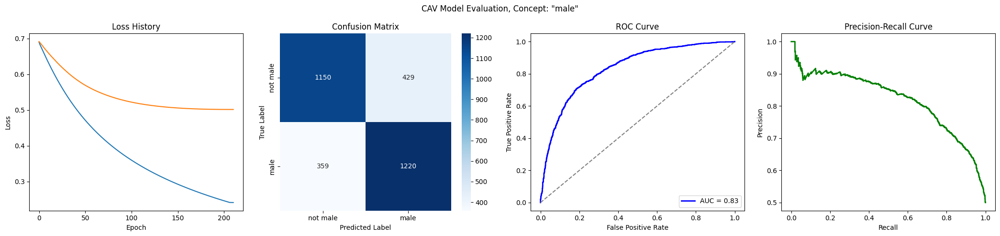

Training run 94/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6881
Epoch 1 Validation Loss: 0.6856
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6396
Epoch 11 Validation Loss: 0.6592
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5969
Epoch 21 Validation Loss: 0.6347
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5595
Epoch 31 Validation Loss: 0.6127
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5265
Epoch 41 Validation Loss: 0.5936
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4972
Epoch 51 Validation Loss: 0.5774
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4710
Epoch 61 Validation Loss: 0.5639
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4474
Epoch 71 Validation Loss: 0.5525
Model saved to trai

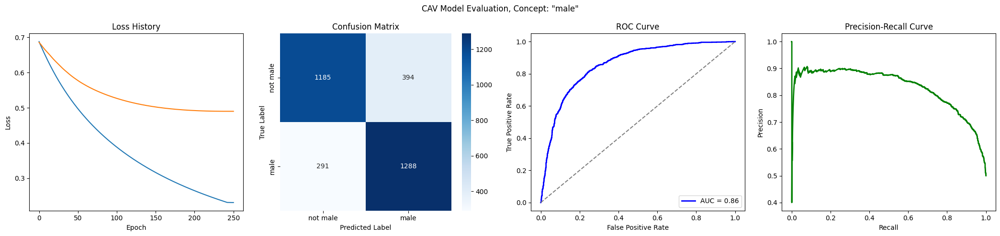

Training run 95/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6994
Epoch 1 Validation Loss: 0.6913
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6433
Epoch 11 Validation Loss: 0.6611
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5955
Epoch 21 Validation Loss: 0.6337
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5553
Epoch 31 Validation Loss: 0.6100
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5211
Epoch 41 Validation Loss: 0.5899
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4919
Epoch 51 Validation Loss: 0.5727
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4663
Epoch 61 Validation Loss: 0.5579
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4437
Epoch 71 Validation Loss: 0.5449
Model saved to trai

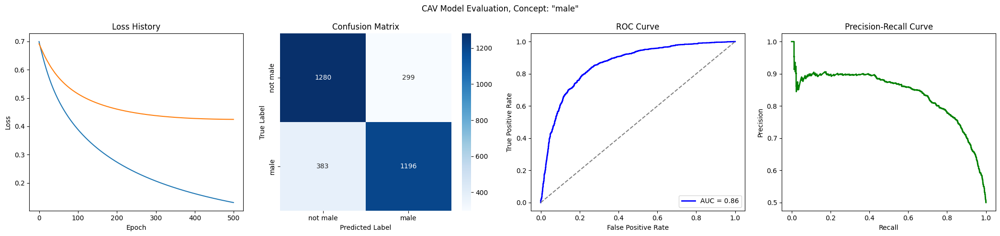

Training run 96/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.7004
Epoch 1 Validation Loss: 0.6880
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6481
Epoch 11 Validation Loss: 0.6582
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.6042
Epoch 21 Validation Loss: 0.6311
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5665
Epoch 31 Validation Loss: 0.6105
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5344
Epoch 41 Validation Loss: 0.5931
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.5069
Epoch 51 Validation Loss: 0.5782
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4829
Epoch 61 Validation Loss: 0.5661
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4616
Epoch 71 Validation Loss: 0.5555
Model saved to trai

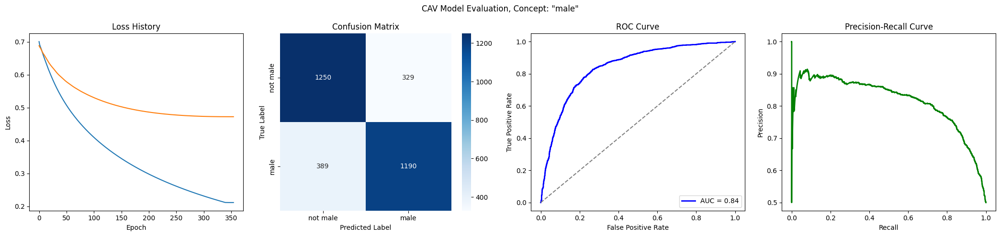

Training run 97/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6922
Epoch 1 Validation Loss: 0.6896
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6413
Epoch 11 Validation Loss: 0.6587
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5962
Epoch 21 Validation Loss: 0.6328
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5569
Epoch 31 Validation Loss: 0.6115
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5228
Epoch 41 Validation Loss: 0.5939
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4929
Epoch 51 Validation Loss: 0.5795
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4665
Epoch 61 Validation Loss: 0.5675
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4430
Epoch 71 Validation Loss: 0.5576
Model saved to trai

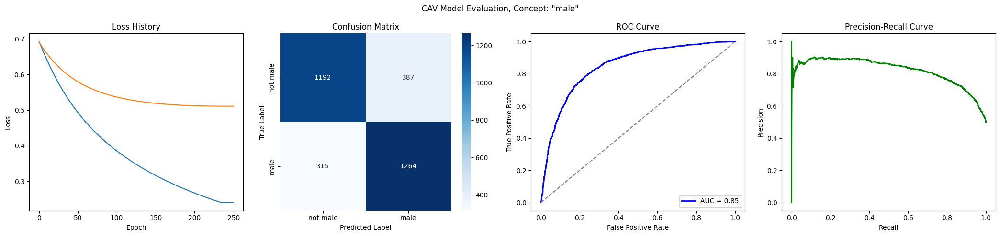

Training run 98/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6896
Epoch 1 Validation Loss: 0.6887
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6329
Epoch 11 Validation Loss: 0.6504
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5831
Epoch 21 Validation Loss: 0.6179
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5399
Epoch 31 Validation Loss: 0.5907
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5026
Epoch 41 Validation Loss: 0.5680
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4703
Epoch 51 Validation Loss: 0.5489
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4419
Epoch 61 Validation Loss: 0.5330
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4169
Epoch 71 Validation Loss: 0.5195
Model saved to trai

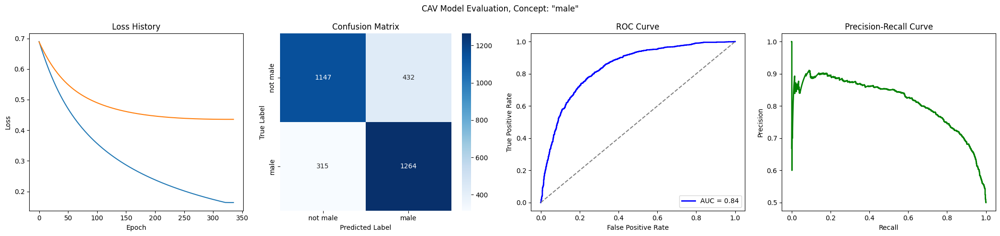

Training run 99/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6909
Epoch 1 Validation Loss: 0.6903
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6414
Epoch 11 Validation Loss: 0.6563
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5976
Epoch 21 Validation Loss: 0.6260
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5595
Epoch 31 Validation Loss: 0.6001
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5267
Epoch 41 Validation Loss: 0.5781
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4982
Epoch 51 Validation Loss: 0.5593
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4733
Epoch 61 Validation Loss: 0.5430
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4511
Epoch 71 Validation Loss: 0.5291
Model saved to trai

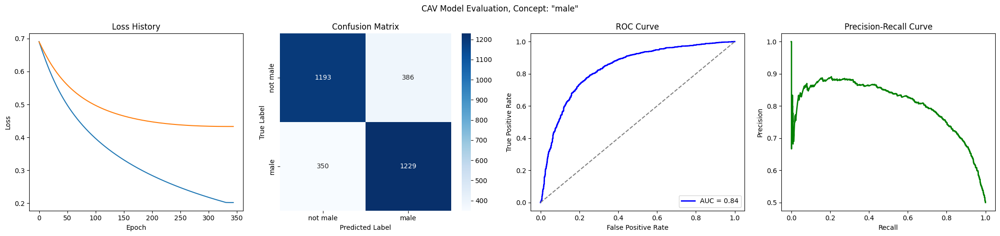

Training run 100/100
200 200
Epoch 1/500
Epoch 1 Train Loss: 0.6949
Epoch 1 Validation Loss: 0.6885
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.6416
Epoch 11 Validation Loss: 0.6598
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.5959
Epoch 21 Validation Loss: 0.6331
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.5560
Epoch 31 Validation Loss: 0.6106
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.5216
Epoch 41 Validation Loss: 0.5911
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.4917
Epoch 51 Validation Loss: 0.5741
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.4655
Epoch 61 Validation Loss: 0.5597
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.4423
Epoch 71 Validation Loss: 0.5472
Model saved to tra

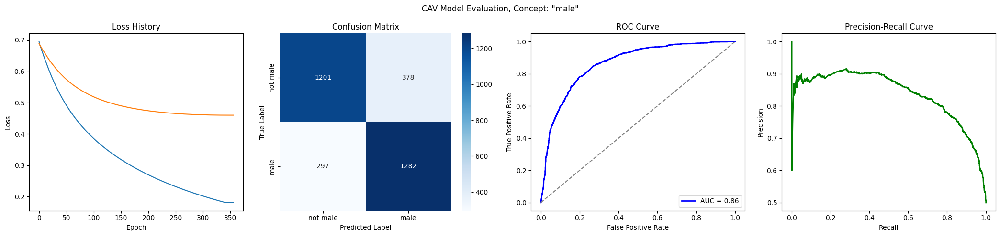

CPU times: user 33min 12s, sys: 51min 45s, total: 1h 24min 58s
Wall time: 5h 21min


In [ ]:
%%time

cav_vectors = []
evaluation_metrics = []

for i in range(num_train_runs):
    print(f"Training run {i + 1}/{num_train_runs}")

    cav_vector, evaluation_metric = train_one_cav(
        train_index=i + 1,
        df=df,
        project_name=project_name,
        encoder_id=encoder_id,
        target_positive_class=target_positive_class,
        training_sample_count=training_sample_count,
        epochs=epochs,
        batch_size=batch_size,
        learning_rate=learning_rate,
        embedding_dim=embedding_dim,
        dropout_rate=dropout_rate,
        test_dataloader=test_dataloader,
    )

    cav_vectors.append(cav_vector)
    evaluation_metrics.append(evaluation_metric)


store_cav_vector_array(cav_vectors, f"cav_ttest_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metrics, f"evaluation_metrics_ttest_{project_name}.json", project_name
)


## 2. Train CAV for Qualitative Tests


In [ ]:
train_val_split = 0.9

# training parameters
epochs = 500
batch_size = 128
learning_rate = 0.002
embedding_dim = 768
dropout_rate = 0.0

### Prepare Data


In [ ]:
import os

import pandas as pd
import s3fs
from cavmir.training.dataset import (
    create_dataloader_from_webdataset_path,
    create_webdataset,
)
from cavmir.utils import (
    append_embeddings_to_df,
    create_training_samples_from_df,
    train_one_cav,
    store_cav_vector_array,
    store_evaluation_metrics,
)

s3 = s3fs.S3FileSystem(anon=False)

dataset_prefix = os.environ["DATASET_PREFIX"]
embedding_prefix = os.environ["EMBEDDING_PREFIX"]


In [ ]:
# load training set
df = pd.read_csv(os.path.join(dataset_prefix, f"train_dataset_{project_name}.csv"))
df = append_embeddings_to_df(df, embedding_prefix, encoder_id, s3)

training_sample_count = int(len(df) * train_val_split)
validation_sample_count = len(df) - training_sample_count


In [ ]:
validation_sample_count

1034

In [ ]:
# create test set for evaluation
df_test = pd.read_csv(os.path.join(dataset_prefix, f"test_dataset_{project_name}.csv"))
df_test = append_embeddings_to_df(df_test, embedding_prefix, encoder_id, s3)

create_webdataset(
    create_training_samples_from_df(df_test),
    f"datasets/{encoder_id}_test_{project_name}.tar",
)

test_dataloader = create_dataloader_from_webdataset_path(
    f"datasets/{encoder_id}_test_{project_name}.tar", batch_size=batch_size
)

### Training


9306 1034
Epoch 1/500
Epoch 1 Train Loss: 0.6240
Epoch 1 Validation Loss: 0.5413
Model saved to trainings/gender_male/state_dict.pth
Epoch 11/500
Epoch 11 Train Loss: 0.3621
Epoch 11 Validation Loss: 0.3297
Model saved to trainings/gender_male/state_dict.pth
Epoch 21/500
Epoch 21 Train Loss: 0.3267
Epoch 21 Validation Loss: 0.3030
Model saved to trainings/gender_male/state_dict.pth
Epoch 31/500
Epoch 31 Train Loss: 0.3108
Epoch 31 Validation Loss: 0.2925
Model saved to trainings/gender_male/state_dict.pth
Epoch 41/500
Epoch 41 Train Loss: 0.3012
Epoch 41 Validation Loss: 0.2871
Model saved to trainings/gender_male/state_dict.pth
Epoch 51/500
Epoch 51 Train Loss: 0.2945
Epoch 51 Validation Loss: 0.2838
Model saved to trainings/gender_male/state_dict.pth
Epoch 61/500
Epoch 61 Train Loss: 0.2895
Epoch 61 Validation Loss: 0.2815
Model saved to trainings/gender_male/state_dict.pth
Epoch 71/500
Epoch 71 Train Loss: 0.2855
Epoch 71 Validation Loss: 0.2799
Model saved to trainings/gender_male/

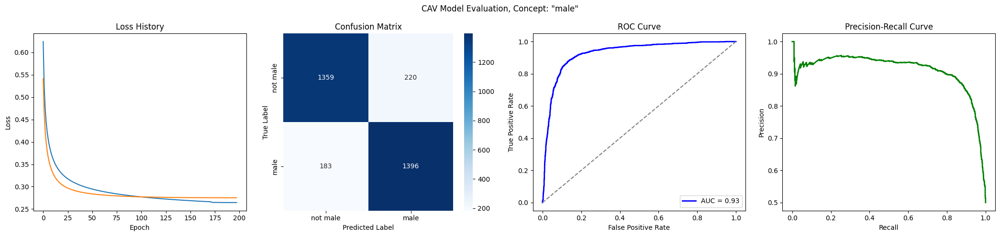

In [ ]:
cav_vector, evaluation_metric = train_one_cav(
    train_index=0,
    df=df,
    project_name=project_name,
    encoder_id=encoder_id,
    target_positive_class=target_positive_class,
    training_sample_count=training_sample_count,
    validation_sample_count=validation_sample_count,
    epochs=epochs,
    batch_size=batch_size,
    learning_rate=learning_rate,
    embedding_dim=embedding_dim,
    dropout_rate=dropout_rate,
    test_dataloader=test_dataloader,
)


store_cav_vector_array(cav_vector, f"cav_full_{project_name}.npy", project_name)
store_evaluation_metrics(
    evaluation_metric, f"evaluation_metrics_full_{project_name}.json", project_name
)
